## Question 1

In [80]:
import pandas as pd
from collections import Counter
import ast
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter("ignore")
from scipy.signal import find_peaks
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from itertools import combinations
from collections import Counter
import networkx as nx
from scipy.stats import chi2_contingency
from src.utils.utils_Q1 import *

In [81]:
# Import data
data = pd.read_csv("data/data_Q1.csv")
df_wars = pd.DataFrame(data)
df_movies = pd.read_csv("data/filtered_movie_data.csv")
# Filtering the data considering years in the dataframes
df_wars = df_wars[(df_wars["StartYear"] >= 1931) & (df_wars["EndYear"] <= 2012)]
df_movies = df_movies[(df_movies["Year"] >= 1931) & (df_movies["Year"] <= 2012)]

In [82]:
'''
Looking for genres based on the chosen key words in order to find interesting and appropriate genres to inspect
'''

# Get the unique genres
df_movies['Genres'] = df_movies['Genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
exploded_genres = df_movies.explode('Genres')
unique_genres = exploded_genres['Genres'].unique()

# List of word parts to search for in genres
search_terms = ["war", "spy", "patriot", "propagand", "hero", "social", "politic", "apocalyp", "topia"]
pattern = '|'.join(search_terms)  

# Filter genres
matching_genres = [genre for genre in unique_genres if isinstance(genre, str) and pd.Series(genre).str.contains(pattern, case=False, na=False).any()]

# Print the matching genres
print(matching_genres)

['War film', 'Political drama', 'Superhero movie', 'Spy', 'Political cinema', 'Dystopia', 'Political satire', 'Social issues', 'Social problem film', 'Propaganda film', 'Gulf War', 'Political thriller', 'Superhero', 'Apocalyptic and postapocalyptic fiction', 'Antiwar', 'Antiwar film', 'Glamorized Spy Film', 'Nuclear warfare', 'Cold War', 'War effort', 'Patriotic film', 'Political Documetary', 'The Netherlands in World War II']


In [83]:
# Do the cleaning for similar genres found earlier
df_movies = clean_genres(df_movies, "Superhero", "Superhero movie")
df_movies = clean_genres(df_movies, "Antiwar", "Antiwar film")
df_movies = clean_genres(df_movies, "Social issues", "Social problem film")
df_movies = clean_genres(df_movies, "Spy", "Glamorized Spy Film")
df_movies = clean_genres(df_movies, "Family Film", "Family")
df_movies = clean_genres(df_movies, "Romance Film", "Romance")

# Identified the genres from the list that are encountered too rarely for analysis
print(count_genre_over_years(df_movies, "Patriotic film")["Count"].sum())
print(count_genre_over_years(df_movies, "Nuclear warfare")["Count"].sum())
print(count_genre_over_years(df_movies, "War effort")["Count"].sum())
print(count_genre_over_years(df_movies, "Political Documetary")["Count"].sum())

2.0
2.0
1.0
1.0


In [84]:
# Identified the genres to inspect, grouped the genres into groups of similar theme for further analysis
inspected_genres = ["War film", "Spy", "Superhero", "Antiwar", "Social issues", "Political satire", "Political thriller", "Political cinema", "Political drama", "Dystopia", "Apocalyptic and postapocalyptic fiction"]
military_genres = ["War film", "Spy", "Superhero"]
military_and_antiwar = ["War film", "Spy", "Superhero", "Antiwar"]
reflecting_genres = ["Political satire", "Political thriller", "Political cinema", "Political drama"]
dystopian_genres = ["Dystopia", "Apocalyptic and postapocalyptic fiction"]
positive_genres = ["Family Film", "Romance Film", "Comedy", "Romantic comedy", "Fantasy"]

In [85]:
military_events = inspect_peaks_events(df_movies, df_wars, military_genres, 0.1, "Military Genres", "trend_numwars_military")
mil_antiwar_peaks = inspect_peaks_events(df_movies, df_wars, military_and_antiwar, 0.1, "Military and Antiwar Genres", "trend_numwars_antiwarmilitary")
polit_peaks = inspect_peaks_events(df_movies, df_wars, reflecting_genres, 0.02, "Political Genres", "trend_numwars_political")
dystop_peaks = inspect_peaks_events(df_movies, df_wars, dystopian_genres, 0.004, "Dystopian and Antiapocalyptic Genres", "trend_numwars_dystopian")

TypeError: inspect_peaks_events() takes 4 positional arguments but 6 were given

In [ ]:
'''
From the final_df's produced for each group of genres, find the wars that appear in at least 2 dataframes and filter for more than 2000 movies released
in the period of the war in order to define the wars most interesting for further analysis.
'''

military_events = set(military_events['War Name'])
mil_antiwar_peaks = set(mil_antiwar_peaks['War Name'])
polit_peaks = set(polit_peaks['War Name'])
dystop_peaks = set(dystop_peaks['War Name'])

# Combine all sets into a list for easier iteration
war_name_sets = [military_events, mil_antiwar_peaks, polit_peaks, dystop_peaks]

# Use a dictionary to count occurrences of each war name across the DataFrames
from collections import Counter

war_name_counter = Counter()

# Count occurrences of each war name in the union of all sets
for war_set in war_name_sets:
    war_name_counter.update(war_set)

# Get the list of war names that appear in at least two DataFrames
at_least_two = [war for war, count in war_name_counter.items() if count >= 2]

print("War Names present in at least 2 dataframes:", at_least_two)
movies_released = {}
for warname in at_least_two:
    war = df_wars[df_wars["WarName"] == warname]
    starting = war["StartYear"].values[0]
    ending = war["EndYear"].values[0]
    releases = df_movies[(df_movies["Year"] >= starting) & (df_movies["Year"] <= ending)].shape[0]
    movies_released[warname] = releases
    
filtered_wars = {key: value for key, value in movies_released.items() if value >= 2000}
print(filtered_wars)

## Question 2

This section of our research is devolved to the following research question:   
`How do movie genre preferences differ between countries in conflict?`   
in which we investigate variations in genre trends across nations, focusing on contrasts during political tensions and on how different nations respond to similar historical events.

### Imports

In [38]:
from src.utils.utils_movie import *
from src.utils.utils_wars import *
from src.utils.interactive_plots import *
import warnings
warnings.filterwarnings("ignore")

In [39]:
movies = load_data_movies(movies_path_base)
wars = load_data_wars(wars_path_base)

In [40]:
movies.head()

,Movie_ID,IMDb_Index,Title,Original_Title,Release_Date,Year,Genres,Genres_IMDb,Rating,Votes,Revenue,Length,Languages,Countries,summary
0,975900,tt0228333,Ghosts of Mars,Ghosts of Mars,2001-08-24,2001,"[Thriller, Science Fiction, Horror, Adventure,...","[Action, Horror, Sci-Fi]",4.9,58872,14010832.0,98.0,['English Language'],[United States of America],"Set in the second half of the 22nd century, th..."
1,261236,tt0083949,A Woman in Flames,Die flambierte Frau,1983,1983,[Drama],[Drama],5.9,648,NaN,106.0,['German Language'],[Germany],"Eva, an upper class housewife, becomes frustra..."
2,171005,tt0097499,Henry V,Henry V,1989-11-08,1989,"[Costume drama, War film, Epic, Period piece, ...","[Biography, Drama, History]",7.5,32088,10161099.0,137.0,['English Language'],[United Kingdom],{{Plot|dateAct 1Act 2Act 3Act 4Act 5 Finally n...
3,77856,tt0058331,Mary Poppins,Mary Poppins,1964-08-27,1964,"[ChildrensFamily, Musical, Fantasy, Comedy, Dr...","[Comedy, Family, Fantasy]",7.8,189202,102272727.0,139.0,['English Language'],[United States of America],The film opens with Mary Poppins perched in a...
4,32456683,tt0061637,Die Fahne von Kriwoj Rog,Die Fahne von Kriwoj Rog,1967,1967,[],[Drama],7.7,24,NaN,108.0,['German Language'],[German Democratic Republic],"Otto Brosowski, a communist miner, writes to t..."


In [41]:
wars.drop(columns=["BatDeath", "Outcome"], inplace=True)
wars.head()

,StateName,Side,StartYear,EndYear,WhereFought,Movies
WarName,,,,,,
Second Sino-Japanese,Japan,1,1931,1933,7,931
Second Sino-Japanese,China,2,1931,1933,7,931
Chaco,Bolivia,2,1932,1935,1,1198
Chaco,Paraguay,1,1932,1935,1,1198
Saudi-Yemeni,Saudi Arabia,1,1934,1934,6,806


In [42]:
conflicts_to_check = []
war_names = list(set(sorted(wars.index)))
for war in war_names:
    print(war)
    war_data = wars[wars.index==war]
    side_1, side_2 = find_sides(war_data)
    start_year, end_year = find_years(war_data)
    movies_war = find_movies_year(movies, start_year, end_year)
    movies_war_1 = find_movies_side(movies_war, side_1)
    movies_war_2 = find_movies_side(movies_war, side_2)
    if movies_war_1 is not None and movies_war_2 is not None:
        conflicts_to_check.append(war)
print(f"The conflicts to check are {conflicts_to_check}")

Kargil War
Second Ogaden War, Phase 2
IfniWar
Assam
Badme Border
Saudi-Yemeni
Bosnian Independence
War over Lebanon
War over Angola
Cold War
Vietnam War, Phase 2
Second Kashmir
Invasion of Iraq
Iran-Iraq
Soviet Invasion of Hungary
War over the Aouzou Strip
Gulf War
Invasion of Afghanistan
Russo-Georgian War
Vietnamese-Cambodian
War for Kosovo
Cenepa Valley
Six Day War
First Libyan Civil War
Korean
Chaco
Football War
Ugandian-Tanzanian
Bangladesh
Heglig Crisis
Nomonhan
Sinai War
Taiwan Straits
Gaza-Israel conflict
Russo-Finnish
Sino-Vietnamese Border War
Third Sino-Japanese
Changkufeng
Arab-Israeli
Falkland Islands
Conquest of Ethiopia
Turco-Cypriot
Off-shore Islands
War of Attrition
Sino-Vietnamese Punitive
Yom Kippur War
Azeri-Armenian
First Kashmir
Second Laotian, Phase 2
Communist Coalition
Franco-Thai
World War II
Second Sino-Japanese
The conflicts to check are ['Kargil War', 'Cold War', 'Vietnam War, Phase 2', 'Invasion of Iraq', 'Russo-Georgian War', 'Korean', 'Sinai War', 'Sino-

Out of the list of conflicts obtained this way, we will focus our analysis on a subset of them, made of the ones with the highest historical importance and the highest amount of data in the dataset.   
The 4 conflicts we will focus on will be `Cold War`, `Korean War`, `Vietnam War` and `World War II`.

### Geographical Illustration

In this section we give a quick overview of the analyzed conflicts, by showing for each country a world map showing the countries on each side of the conflict. This distinction between `Side 1` (Red) and `Side 2` (Blue) will be important for a deeper understanding of the following sections.

In [ ]:
war_names_r = ["Cold War", "Korean", "Vietnam War, Phase 2", "World War II"]
for war in war_names_r:
    side_1, side_2 = find_sides(wars[wars.index==war])
    plot_countries(side_1, side_2, war)

ValueError: 
The orca executable is required to export figures as static images,
but it could not be found on the system path.

Searched for executable 'orca' on the following path:
    /opt/anaconda3/bin
    /Library/Frameworks/Python.framework/Versions/3.11/bin
    /usr/local/bin
    /System/Cryptexes/App/usr/bin
    /usr/bin
    /bin
    /usr/sbin
    /sbin
    /var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/local/bin
    /var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/bin
    /var/run/com.apple.security.cryptexd/codex.system/bootstrap/usr/appleinternal/bin
    /Applications/quarto/bin
    /opt/anaconda3/bin
    /opt/anaconda3/condabin
    /Library/Frameworks/Python.framework/Versions/3.11/bin

If you haven't installed orca yet, you can do so using conda as follows:

    $ conda install -c plotly plotly-orca

Alternatively, see other installation methods in the orca project README at
https://github.com/plotly/orca

After installation is complete, no further configuration should be needed.

If you have installed orca, then for some reason plotly.py was unable to
locate it. In this case, set the `plotly.io.orca.config.executable`
property to the full path of your orca executable. For example:

    >>> plotly.io.orca.config.executable = '/path/to/orca'

After updating this executable property, try the export operation again.
If it is successful then you may want to save this configuration so that it
will be applied automatically in future sessions. You can do this as follows:

    >>> plotly.io.orca.config.save()

If you're still having trouble, feel free to ask for help on the forums at
https://community.plot.ly/c/api/python


### Timeline Illustration

Another plot helpful in the understanding of the setting of the analysis is the following timeline, which aims to show the number of movies produced over the course of the years relative to each one of the considered conflicts. To obtain the plot, we filter the dataset based on the `summary` column, looking for the name of the conflict (or abbreviations, such as WW2):

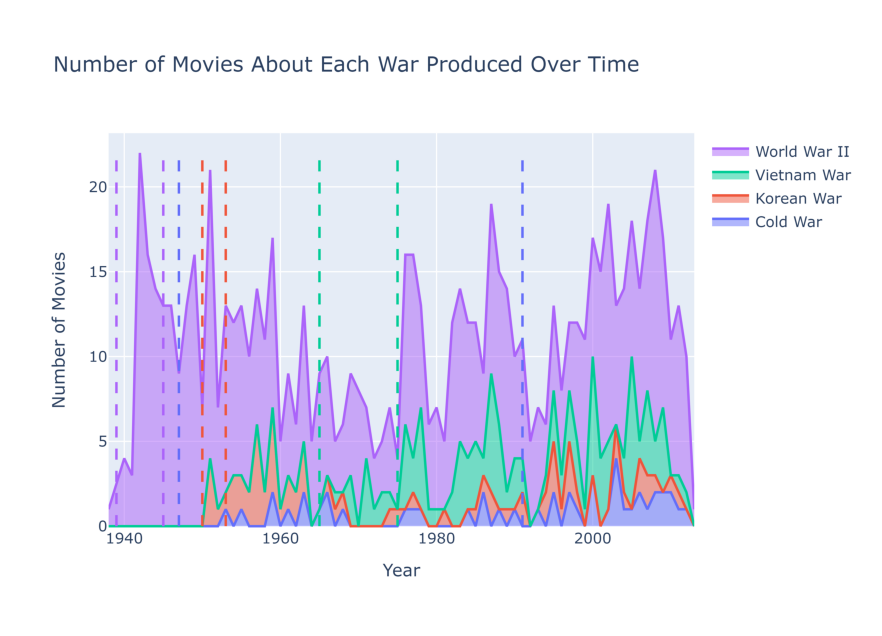

In [7]:
plot_movies_timeline(wars, movies, war_names_r, True)

The plot shows a large area associated to movies related to `World War II`, much larger than that of all other conflicts combined. This highlights the influence a conflict of such scale has had on the world even further in the future.   
A more in-depth inspection of the graph shows how, despite the general movies trend are characterized by an overall increase in movies produced every year, the peak in production of WWII movies has peaked during the conflict itself, to then decrease gradually over time to then settle between 10-15 movies a year in the XXI century.   
Movies on the `Vietnam War` were not produced inconsistently across all years starting from the war, reaching their peak in 2005 with 9 movies.   
The `Korean War` has had its highest movies production in the period right after the war, in the 1950s, after which it hasn-t received much attention in the cinematographic world, achieving at most 3 movies per year ever since.   
Finally, contrary to our expectations, the `Cold War` itself didn't get much attention during the course of the years, with no more than 4 movies produced in a given year making it the lowest in our analysis.

### Quantitative Analysis

The final introductive plot of this section is a sunburst chart which depicts for each war where the movies obtained by the previous filtering are produced, using the same division between `Side 1` and `Side 2` as in the section for `Geographical Illustration`.   
This section is mainly aimed at depicting a comparison between the way the opposing countries in the war (as well as the ones not directly involved) were influenced by the conflicts, in terms of a purely quantitative rather than qualitative analysis.   
For each of the following plots, the `Red` section corresponds to `Side 1`, the `Blue` one to `Side 2` and the `Green` one to movies produced in `other countries`.

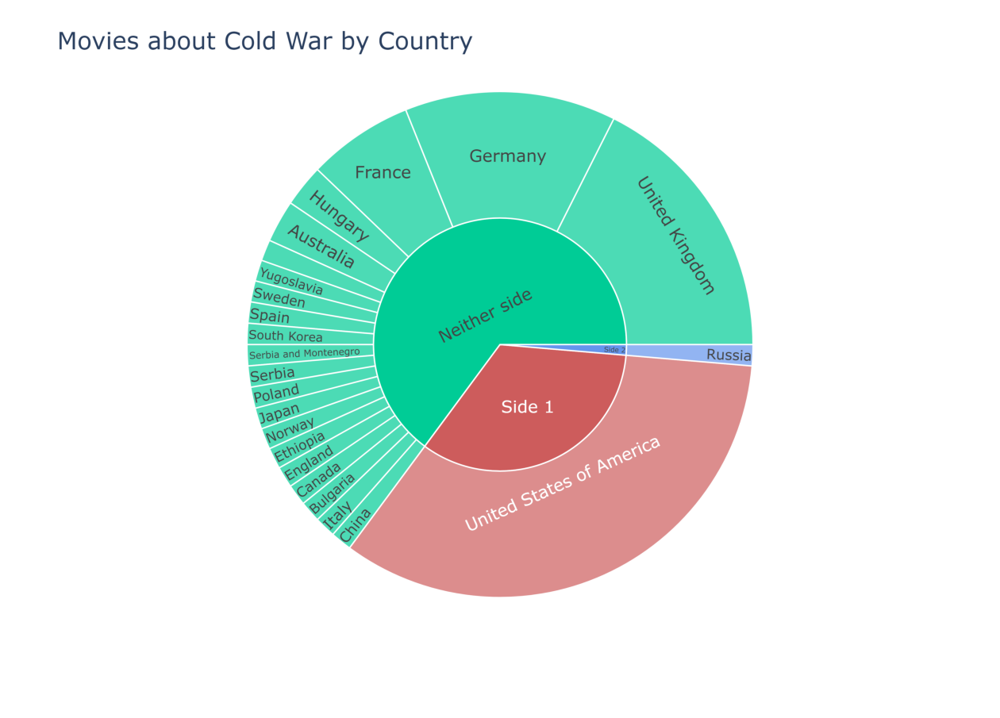

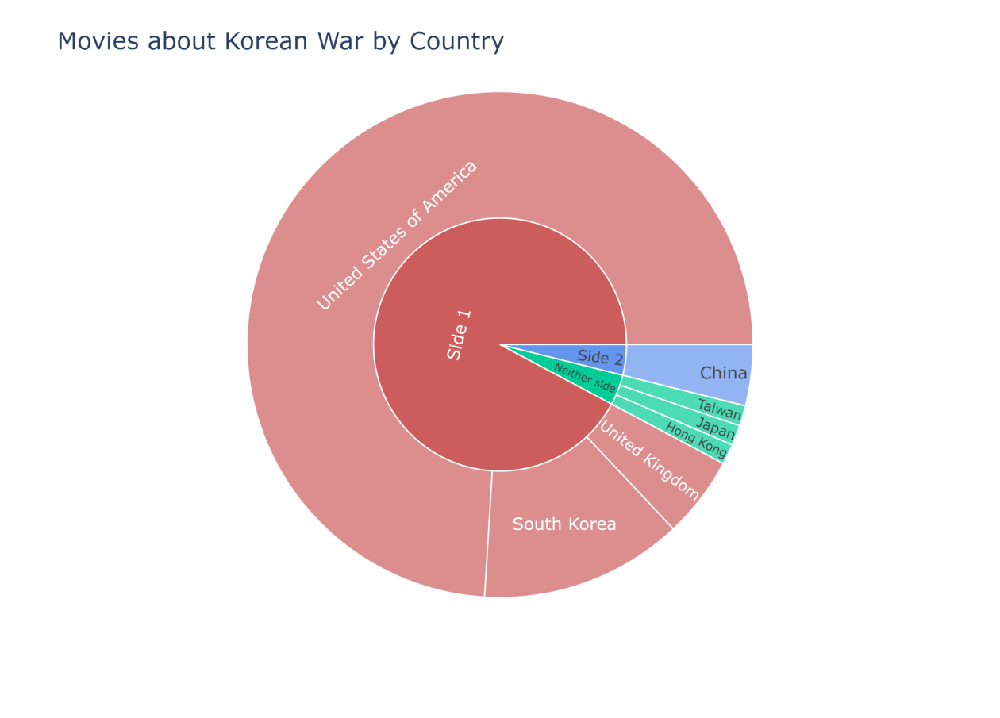

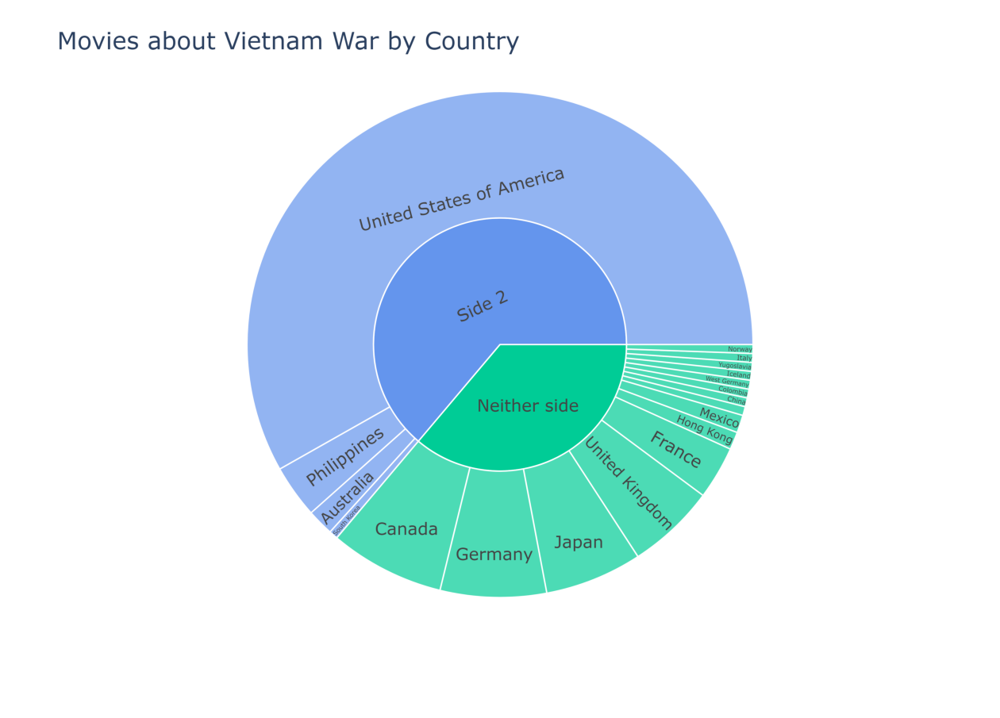

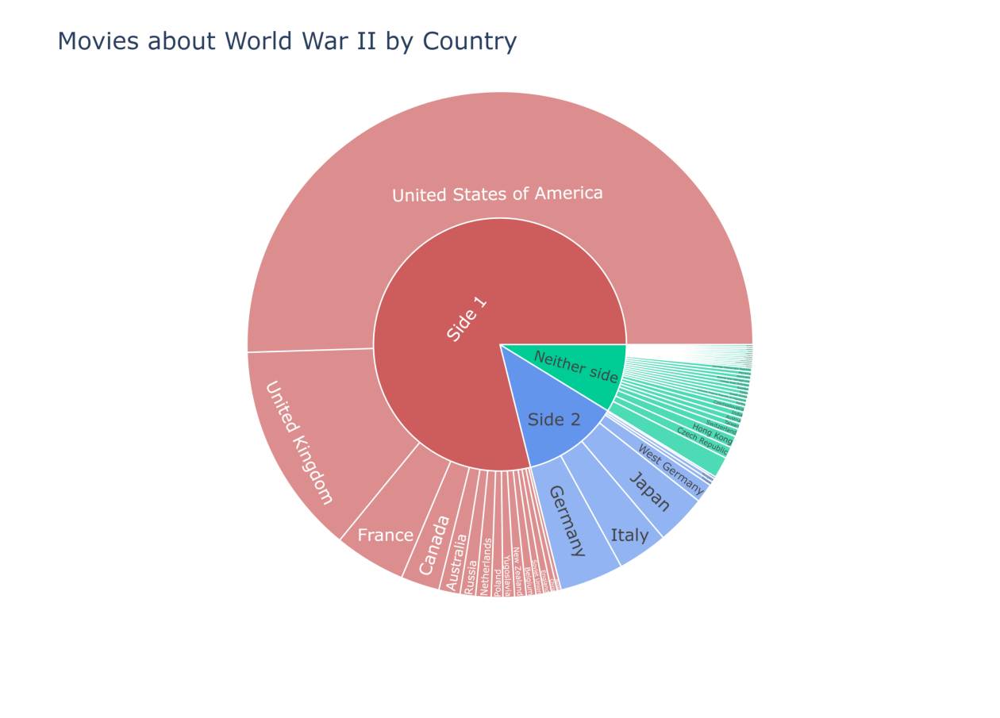

In [8]:
for war in war_names_r:
    plot_country_piechart(wars, movies, war)

A comment which can be made for each of these graphs is that United States take up the largest slice of the chart divided by countries, and this is largely due to the fact that the United States contribute in the largest amount to all movies produced, regardless of the topic.   

Entering more in detail, we see that for the `Cold War` the largest part of the movies were produced by countries not directly involved in the conflict, showing how such a conflict has impacted the whole world and not only the two opposing sides. As stated before, the USA contribute to the largest part of the movies, while Russia, despite being one of the two involved countries, only amounts to a single movie in our chart, surpassed by the large european countries such as Germany, UK and France.

Once again, for the `Korean War`, most of the movies were produced by the USA, but if we exclude its contribution we can see that South Korea, one of the countries directly involved in the conflict, is the largest producer of movies on the conflict. Follow the UK and China, alongside some other Asian countries.

For the `Vietnam War` we can see from the chart that no movies about it were released in Vietnam, only country directly involved in the war as "Side 2" in our dataset, while the movies are almost equally distributed among the various countries (as usual, exception made for the USA).

Finally, regarding `World War II`, we can see that the largest forces of the conflict lead the movie production, with the USA having released more than 400 movies, the UK more than 100 and countries such as France, Germany, Italy and Japan all with more than 20 movies each.
On top of this, the massive influence of the conflict can also be seen from the large number of smaller countries having released some movies about it, with movies released in more than 50 countries in total!

### Movie Genres by Depicted Country

In this and the following sections we delve deeper in the qualitative analysis and comparison between the two sides of the conflicts, analyzing the different distribution in movie genres for different subsets of the Movies dataset.   
Here we provide a first analysis by filtering our dataset based on the movies released in a historical period around each of the analyzed war, and check what is the movie genre of the movies depicting countries from either side of the conflict.   
To do this we first filter the dataset for movies released in a period of time of 2 years around the conflict by looking at the `Year` column, after which we filter the dataset once again based on the `Summary` column, but this time we look for movies mentioning the countries on either side (an alternative approach would be to look for movies released in such countries in this same timeframe, but this ends up reducing the dataset size too much and not providing enough data for any result).   
We plot our results in two barplots, one for each side of the war, each one showing not only the genre distribution for that period of time but also the genre distribution over the whole dataset, to provide through comparison additional information about the way this sentiment changed overtime.   

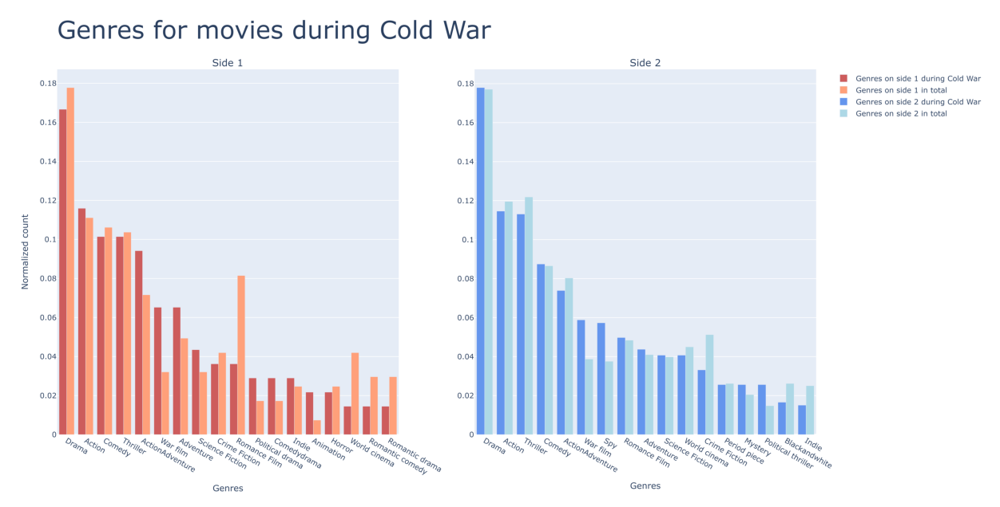

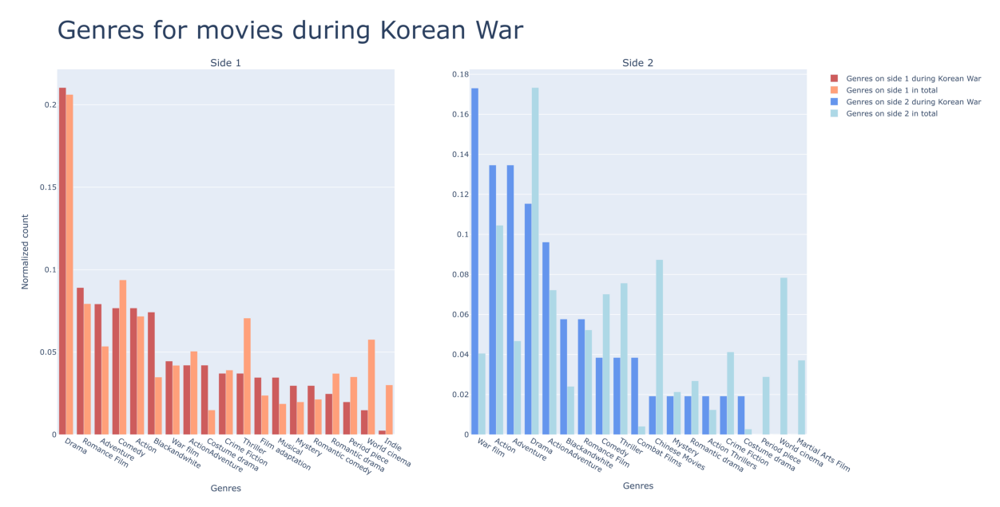

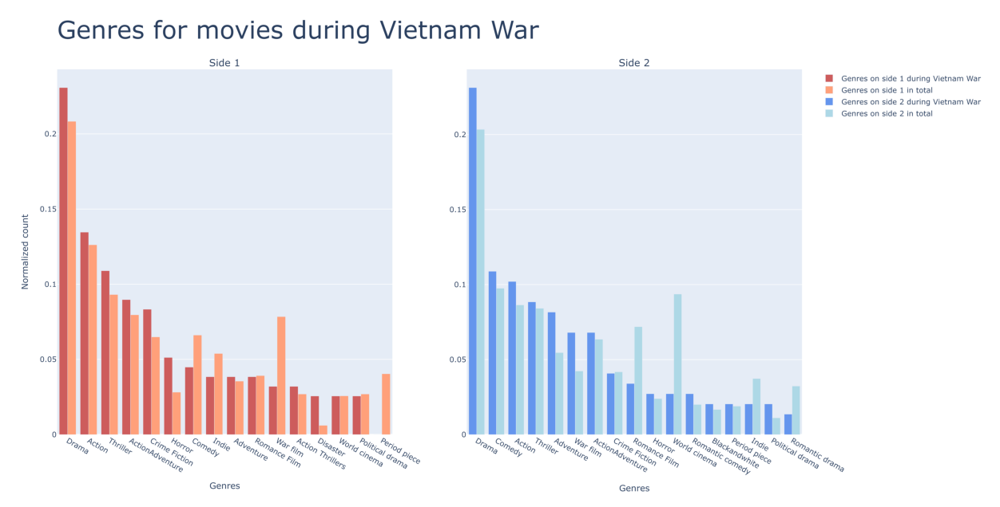

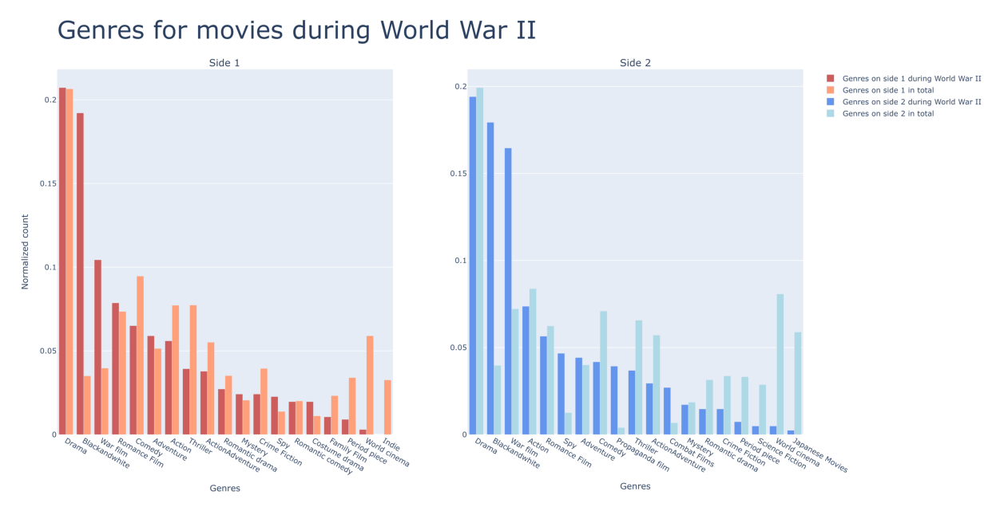

In [9]:
for war in war_names_r:
    plot_genres_year_side(*get_genres_year_side(wars, movies, war, mode="summary"))
    # plot_genres_year_side(*get_genres_year_side(wars, movies, war, mode="country"))

A first look at the plot makes it easy to see that genres like `Drama` are the most common overall, wo we will not consider these common trends in the analysis, but we will focus more on the distinctions between the two sides and between the specific time period vs the entire dataset.

During the `Cold War`, on Side 1 genres like Adventure, ActionAdventure, and War Films show a significant increase compared to the whole dataset, while genres related to romance are less common in this period of time. On Side 2, instead, Spy films and War films stood out more, alongside Political Thrillers, suggesting themes of espionage and historical reflection, themes fairly common in the sentiment of the time. 

During the `Korean War`, a common trend between the two sides was the large presence of BlackandWhite movies, which is mainly to attribute to an historical reason rather than a Geopolitical one. On Side 1, there was a strong emphasis on Romance Films and Adventure films, while Side 2 leaned more into violent themes, such as War Films (which are the most present in this reduced dataset) and Combat Films, highlighting themes of conflict and cultural representation.

The `Vietnam War` era saw a general increase in genres like Action, Thriller, and War Films, emphasizing the conflict's intensity, but the specific response of the two sides was quite different: Side 1 had a much stronger increase in genres like Crime Fiction, Horror and Disaster compared to all other subsets of data analyzed so far, underlying the climate of tension in Vietnam in particular in this period of time. Side 2, on the other hand, had changes more in line with the general trends, with Action, Adventure and War films being more present while Romance and World cinema are less common overall.

Finally, during `World War II`, we see once again the trend for  BlackandWhite films dominating the genre landscape on both sides compared to the overall dataset, once again associated to the analyzed historical period. What characeterizes this period the most is the sharp increase in War Films, which see by far the largest increase, with Spy movies being also fairly common on both sides. On top of this, genres like Adventure and Romance Films were still prominent, reflecting themes of heroism and human struggle. 
The most distinctive trend betwee the two sides is the presence of Propaganda Films on Side 2, alongside genres like Japanese Movies which are instead causes by a purely geographical connotation.

### Movie Genres by Country of Production

This final section of the comparative analysis between countries focuses more on the way the conflict is portrayed in movies produced in different countries. This section applies the same filtering as the one on `Quantitative Analysis`, but goes in depth analyzing the differences in genre between the two movie subsets, although this analysis often times ended up being difficult due to the limited sizes of the sub-datasets.

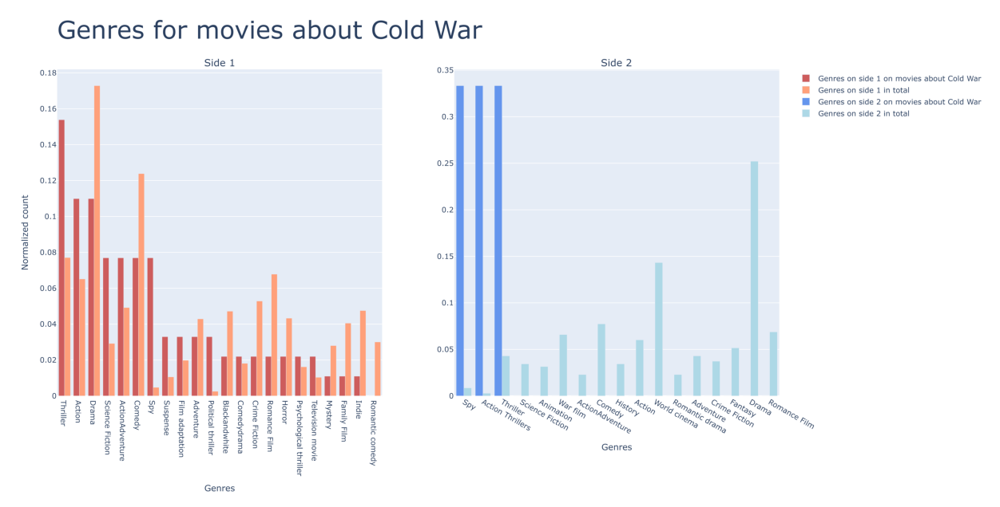

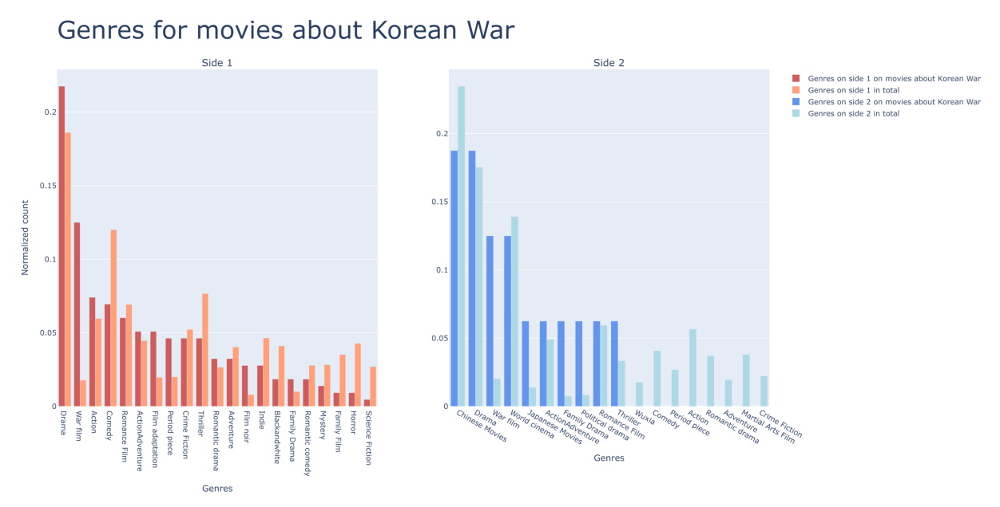

Not Enough Data


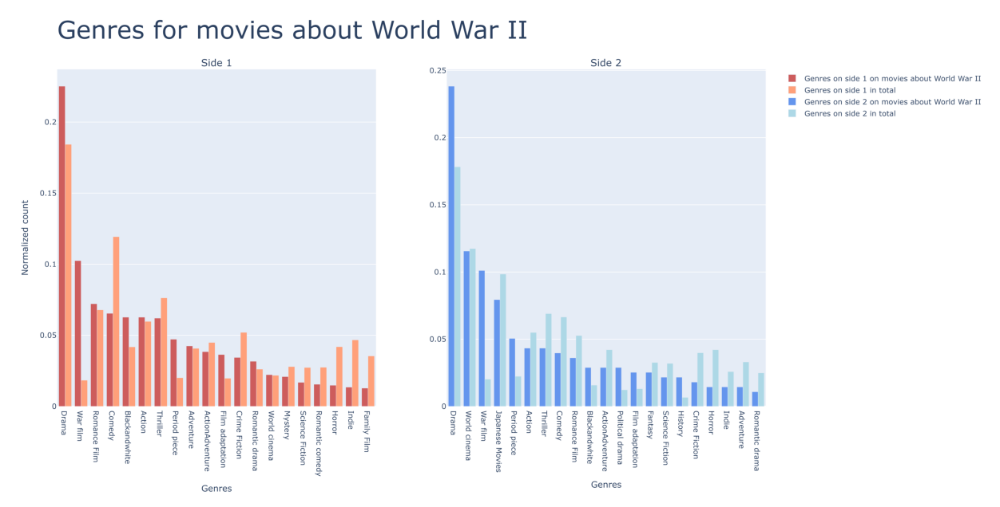

In [10]:
for war in war_names_r:
    plot_genres_summary_side(*get_genres_summary_side(wars, movies, war, mode="country"))
    # plot_genres_summary_side(*get_genres_summary_side(wars, movies, war, mode="summary"))

As stated in the introduction to this section, the fisrt thing  to notice is the fact that for both `Cold War` and `Korean War` one side has much fewer movies compared to the other, while for the `Vietnam War` not enough movies were found for one of the two sides, hence no plot was produced. This leads to a the results relative to these plots less significant overall, but we decided to still mention them for completeness.

The plot for the `Cold War` shows lines of regular heigths in the histogram, due to the small amount of movies plotted. Other than this, the trends in the plot are to be expected, with genres like Thriller and Spy being the most represented in both sides, but a weird-to-explain entry is the presence of Comedy films on Side 1.   
Movies about the `Korean War` show much more different genres on Side 1, while on Side 2 we see a strong geographical component in the genres, with Chinese and Japanese Movies being common.   
Finally, movies about `World War II` are the ones associated with the largest number of movies, information which can also be extracted by the "smoothness" of the histogram distribution. Both sides share a large variety of genres for the movies, with War films and Period Piece being the most significant ones in terms of comparison with the whole dataset, but no significant difference between the two sides can be extracted from he plot.

In general this plots underline how the general sentiment associated to the movies produced during the war and movies which directly reference the war are usually quite serious and tense, so we decided to go more in depth with the analysis of the sentiment of the storytelling, suing techniques derived from Natural Language Processing (NLP).

## Question 3

While our previous analysis revealed distinct patterns in genre production across different countries, a deeper examination of narrative construction within the same genre warrants investigation. Specifically, this section explores how war films, despite sharing a common genre classification, exhibit significant variations in their storytelling approaches based on their country of origin.

Our analysis will focus exclusively on war cinema as it provides a unique window into how different nations process, interpret, and memorialize shared historical events through film. War movies are particularly revealing because they often reflect not only a country's historical perspective but also its contemporary values, national identity, and relationship with military conflict

#### Imports 

In [30]:
import pandas as pd
import numpy as np
from src.utils.sentiment_analysis import *
import plotly.express as px
import seaborn as sns
import warnings
import re
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import ne_chunk
from nltk.sentiment import SentimentIntensityAnalyzer
from ast import literal_eval
import plotly.graph_objects as go 
import plotly.io as pio
from IPython.display import Image
from plotly.subplots import make_subplots
import warnings
from scipy import stats
warnings.filterwarnings("ignore")

In [31]:
# Download necessary NLTK packages for text processing and sentiment analysis
nltk.download('punkt')  # Tokenizer for splitting text into words
nltk.download('averaged_perceptron_tagger')  # POS tagger for grammatical structure
nltk.download('maxent_ne_chunker')  # NER chunker for extracting named entities
nltk.download('words')  # Word corpus for NER
nltk.download('stopwords')  # Common words to exclude from analysis
nltk.download('wordnet')  # Lexical database for English
nltk.download('vader_lexicon')  # Lexicon for sentiment analysis
nltk.download('omw-1.4')

# Define the set of English stopwords to remove common words that don't add meaning
stop_words = set(stopwords.words("english"))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\fatum\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-

In [32]:
# Loading data 
df = pd.read_csv('data/movies_with_summaries.csv')
wars_df = pd.read_csv('data/wars_filtered_clean.csv')
lemmatizer = WordNetLemmatizer()

In [33]:
# Extracting sides
wwii_movies_side1, wwii_movies_side2, cold_war_movies_side1, cold_war_movies_side2, korean_war_movies_side1, korean_war_movies_side2, vietnam_war_movies_side1, vietnam_war_movies_side2 = extracting_side(wars_df, df)

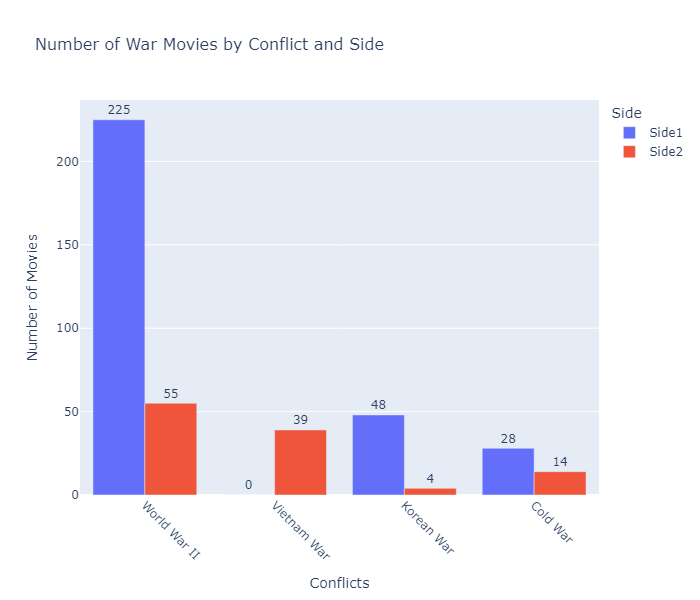

In [34]:

# Number of movies per sides

data = {
    'Wars': ['World War II', 'Vietnam War', 'Korean War', 'Cold War'],
    'Side1': [
        wwii_movies_side1.shape[0], 
        vietnam_war_movies_side1.shape[0], 
        korean_war_movies_side1.shape[0], 
        cold_war_movies_side1.shape[0]
    ],
    'Side2': [
        wwii_movies_side2.shape[0], 
        vietnam_war_movies_side2.shape[0], 
        korean_war_movies_side2.shape[0], 
        cold_war_movies_side2.shape[0]
    ]
}

df_visual = pd.DataFrame(data)

# Melt the dataframe for a grouped bar chart
df_melted = df_visual.melt(id_vars="Wars", var_name="Side", value_name="Number of Movies")

# Create the interactive bar chart with plotly express
fig = px.bar(
    df_melted, 
    x="Wars", 
    y="Number of Movies", 
    color="Side", 
    barmode="group",
    text="Number of Movies",
    title="Number of War Movies by Conflict and Side"
)

fig.update_layout(
    xaxis_title="Conflicts",
    yaxis_title="Number of Movies",
    title_font_size=16,
    xaxis_tickangle=45,
    legend_title="Side",
    font=dict(size=12),
    height=600
)


fig.update_traces(textposition="outside")
# fig.write_html("number_of_war_movies.html")
fig.write_image("number_of_war_movies.png")
Image('number_of_war_movies.png')
os.remove("number_of_war_movies.png")


Given the limited number of movies produced about the Vietnam War and the Korean War, we have decided to focus exclusively on the Cold War and World War II.

# Sentiment Analysis

We will perform a sentiment analysis on the summaries of movies identified. To achieve this, we will use the NLTK (Natural Language Toolkit) library. This analysis will help identify the emotional tone of the summaries, determining whether they are primarily positive, negative, or neutral depending of the countries of production.


In [35]:
## Preprocess the summaries: tokenize and clean the text and Remove stopwords

processed_docs_1 = preprocess_summaries(wwii_movies_side1, stop_words, column_name="summary")
processed_docs_2 = preprocess_summaries(wwii_movies_side2, stop_words, column_name="summary")
processed_docs_3 = preprocess_summaries(cold_war_movies_side1, stop_words, column_name="summary")
processed_docs_4 = preprocess_summaries(cold_war_movies_side2, stop_words, column_name="summary")

NameError: name 'preprocess_summaries' is not defined

In [7]:
## Conduct the Sentiment Analysis

sentiment_df_1=conduct_sentiment_analysis(processed_docs_1, wwii_movies_side1)
sentiment_df_2=conduct_sentiment_analysis(processed_docs_2, wwii_movies_side2)
sentiment_df_3=conduct_sentiment_analysis(processed_docs_3, cold_war_movies_side1)
sentiment_df_4=conduct_sentiment_analysis(processed_docs_4, cold_war_movies_side2)

In [28]:
## Calculte the meand and the IC of the Sentiment Analysis

mean_scores_1 = sentiment_df_1.mean()
mean_scores_2 = sentiment_df_2.mean()
mean_scores_3 = sentiment_df_3.mean()
mean_scores_4 = sentiment_df_4.mean()

ci_wwii_side1 = calculate_confidence_intervals(sentiment_df_1)
ci_wwii_side2 = calculate_confidence_intervals(sentiment_df_2)
ci_cold_side1 = calculate_confidence_intervals(sentiment_df_3)
ci_cold_side2 = calculate_confidence_intervals(sentiment_df_4)



NameError: name 'sentiment_df_1' is not defined

In [29]:
#WWII VISUALISATION

# Visualisation 1 : mean compearison
labels = ['Negative', 'Neutral', 'Positive', 'Compound']
x = np.arange(len(labels))

#Confiance Intervall

ci_lower_1 = mean_scores_1 - ci_wwii_side1['ci_lower'].values
ci_upper_1 = ci_wwii_side1['ci_upper'].values - mean_scores_1

ci_lower_2 = mean_scores_2 - ci_wwii_side2['ci_lower'].values
ci_upper_2 = ci_wwii_side2['ci_upper'].values - mean_scores_2


fig1 = go.Figure()
fig1.add_trace(go.Bar(
    x=labels,
    y=mean_scores_1,
    name='Side 1',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_1,
        arrayminus=ci_lower_1
    ),
    marker_color='blue',
    opacity=0.7
))
fig1.add_trace(go.Bar(
    x=labels,
    y=mean_scores_2,
    name='Side 2',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_2,
        arrayminus=ci_lower_2
    ),
    marker_color='orange',
    opacity=0.7
))

fig1.update_layout(
    title="Comparison of Mean Sentiment Scores for WWII",
    xaxis_title="Sentiment",
    yaxis_title="Mean Sentiment Score",
    barmode='group',
    legend_title="Sides", 
    height = 500,
    autosize=True,
    yaxis=dict(
        tick0=0,
        dtick=0.1, 
        scaleratio=2
    )
)

fig1.write_html("wwii_sentiment_mini.html")
fig1.write_image("wwii_sentiment_mini.png")
Image('wwii_sentiment_mini.png')

NameError: name 'mean_scores_1' is not defined

We do observe a higher negative score which isn't surprizing, however the overlapping confidence intervals across all categories indicate that the differences between the Allied and Axis films' sentiment scores are likely not statistically significant. However, it is surpriing to observe that the confidence intervall is much higher for the compound result. Let's observe the distribution. 

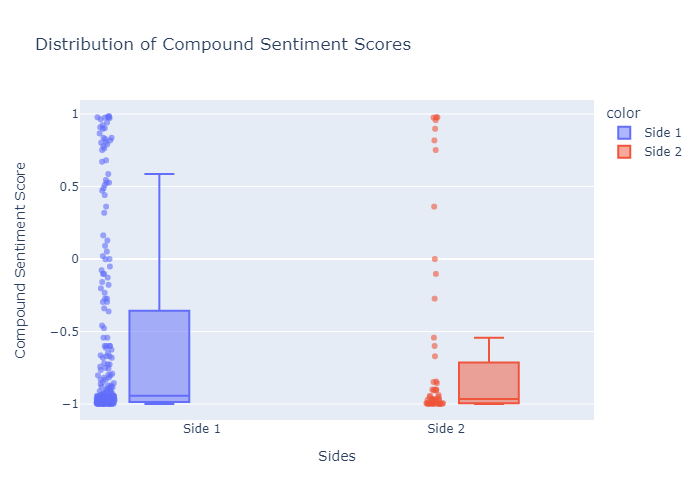

In [10]:
# Visualisation 2 : Distribution of Compound Sentiment Scores
fig2 = px.box(
    x=['Side 1'] * len(sentiment_df_1['compound']) + ['Side 2'] * len(sentiment_df_2['compound']),
    y=np.concatenate([sentiment_df_1['compound'], sentiment_df_2['compound']]),
    labels={"x": "Sides", "y": "Compound Sentiment Score"},
    color=['Side 1'] * len(sentiment_df_1['compound']) + ['Side 2'] * len(sentiment_df_2['compound']),
    title="Distribution of Compound Sentiment Scores",
    boxmode="group"
)

fig2.update_traces(
    boxpoints="all",  
    jitter=0.3,       
    pointpos=-1.8,    
    marker=dict(opacity=0.6)
)

fig2.update_layout(
    title="Distribution of Compound Sentiment Scores",
    xaxis_title="Sides",
    yaxis_title="Compound Sentiment Score",
    height = 500,
    autosize=True
)

fig2.write_html("wwii_distribution_mini.html")
fig2.write_image("wwii_distribution_mini.png")
Image('wwii_distribution_mini.png')

The distribution seems pretty similar among the two samples, however the sample sizes (n=295 for Side 1 and n=64 for Side 2)are imbalanced, which could contribute to the variability observed, particularly for Side 2.

Let's still conduct a T-test to confirm our observations. 

In [11]:
# Perform t-tests for Side 1 and Side 2
t_test_results = perform_t_tests(sentiment_df_1, sentiment_df_2)
print("\nT-Test Results:")
print(t_test_results)


T-Test Results:
    measure  t_statistic   p_value  significant
0       neg    -0.242389  0.809054        False
1       neu    -1.445459  0.151729        False
2       pos     1.771738  0.080265        False
3  compound     0.595366  0.553264        False


We conducted a Student's t-test, and the results confirm that there is absolutely no statistical significance.

However, it remains difficult to draw strong conclusions on this matter. Is our sample size too small? Are the movie plots not representative of the actual content of the films? Before delving deeper into this, let’s carry out the same analysis for Cold War films.

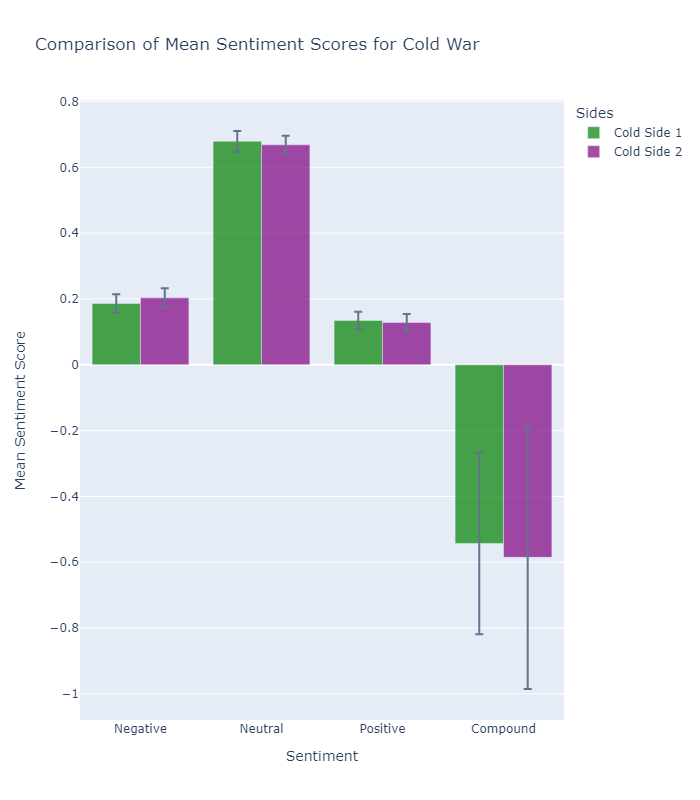

In [13]:
###COLD WAR###

labels = ['Negative', 'Neutral', 'Positive', 'Compound']
x = np.arange(len(labels))

# Confidence Interval Calculation for Cold War
ci_lower_3 = mean_scores_3 - ci_cold_side1['ci_lower'].values
ci_upper_3 = ci_cold_side1['ci_upper'].values - mean_scores_3

ci_lower_4 = mean_scores_4 - ci_cold_side2['ci_lower'].values
ci_upper_4 = ci_cold_side2['ci_upper'].values - mean_scores_4

# Create a bar chart with error bars for Cold War
fig3 = go.Figure()
fig3.add_trace(go.Bar(
    x=labels,
    y=mean_scores_3,
    name='Cold Side 1',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_3,
        arrayminus=ci_lower_3
    ),
    marker_color='green',
    opacity=0.7
))
fig3.add_trace(go.Bar(
    x=labels,
    y=mean_scores_4,
    name='Cold Side 2',
    error_y=dict(
        type='data',
        symmetric=False,
        array=ci_upper_4,
        arrayminus=ci_lower_4
    ),
    marker_color='purple',
    opacity=0.7
))


fig3.update_layout(
    title="Comparison of Mean Sentiment Scores for Cold War",
    xaxis_title="Sentiment",
    yaxis_title="Mean Sentiment Score",
    barmode='group',
    legend_title="Sides",
    height=800
)

# Visualisation 4 : Distribution of Compound Sentiment Scores for Cold War
fig4 = px.box(
    x=['Cold Side 1'] * len(sentiment_df_3['compound']) + ['Cold Side 2'] * len(sentiment_df_4['compound']),
    y=np.concatenate([sentiment_df_3['compound'], sentiment_df_4['compound']]),
    labels={"x": "Sides", "y": "Compound Sentiment Score"},
    color=['Cold Side 1'] * len(sentiment_df_3['compound']) + ['Cold Side 2'] * len(sentiment_df_4['compound']),
    title="Distribution of Compound Sentiment Scores for Cold War",
    boxmode="group"
)


fig4.update_traces(
    boxpoints="all",
    jitter=0.3,       
    pointpos=-1.8,    
    marker=dict(opacity=0.6)
)

fig4.update_layout(
    title="Distribution of Compound Sentiment Scores for Cold War",
    xaxis_title="Sides",
    yaxis_title="Compound Sentiment Score",
    height=800
)


fig3.write_html("comparison_mean_sentiment_cold_war.html")
fig3.write_image("comparison_mean_sentiment_cold_war.png")
Image("comparison_mean_sentiment_cold_war.png")


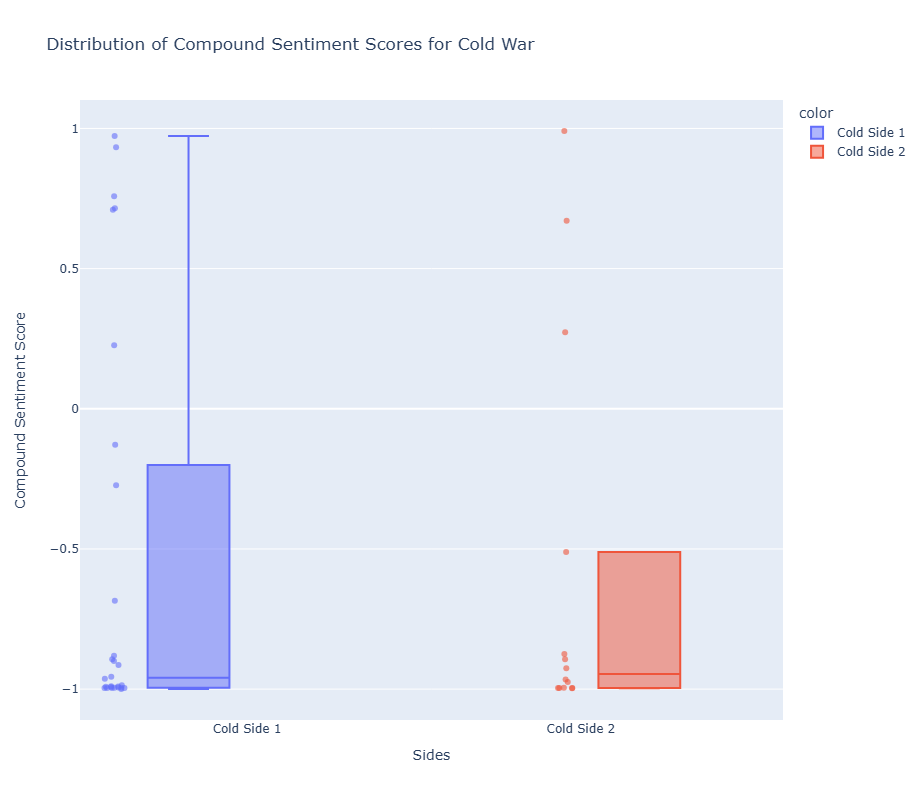

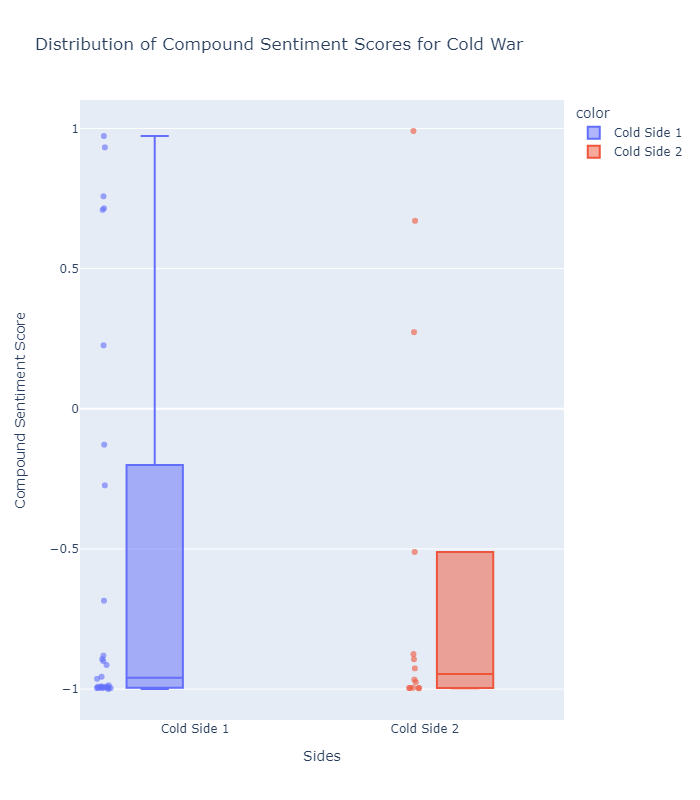

In [14]:
fig4.write_html("distribution_cold_war_sentiment.html")
fig4.write_image("distribution_cold_war_sentiment.png")
Image("distribution_cold_war_sentiment.png")

In [ ]:
# Perform t-tests for Side 1 and Side 2 for cold war
t_test_results = perform_t_tests(sentiment_df_3, sentiment_df_4)


print("\nT-Test Results:")
print(t_test_results)

In conclusion, the results for the Cold War are very similar. The slightly greater variability can be attributed to the smaller sample size.

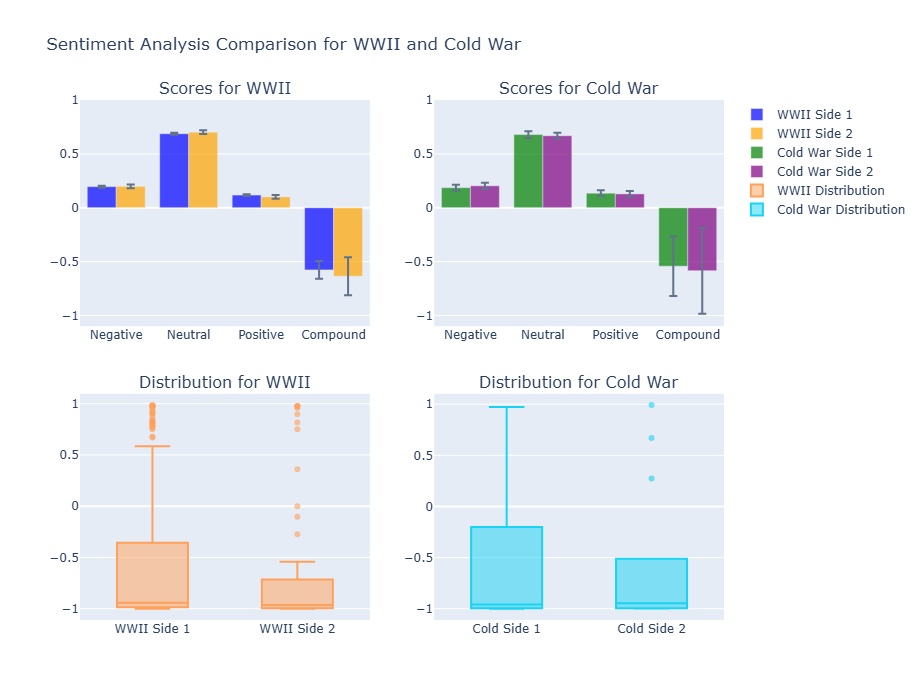

In [52]:


fig = create_global_sentiment_figure(
    mean_scores_1=mean_scores_1,
    mean_scores_2=mean_scores_2,
    mean_scores_3=mean_scores_3,
    mean_scores_4=mean_scores_4,
    ci_wwii_side1=ci_wwii_side1,
    ci_wwii_side2=ci_wwii_side2,
    ci_cold_side1=ci_cold_side1,
    ci_cold_side2=ci_cold_side2,
    sentiment_df_1=sentiment_df_1,
    sentiment_df_2=sentiment_df_2,
    sentiment_df_3=sentiment_df_3,
    sentiment_df_4=sentiment_df_4
)

fig.write_image("final_plot_sentiment.png")
Image("final_plot_sentiment.png")


### Named Entity Recognition

We will now go deeper into the analysis by extracting entities labeled as "ORGANIZATION" and performing entity-level sentiment analysis on them in order to uncover patterns in representation.

In [36]:
# Performing Named Entity Recognition
wars_iterator, war_names, side_iterator = named_entity_recognition(wars_df, wwii_movies_side1, wwii_movies_side2, cold_war_movies_side1, cold_war_movies_side2, lemmatizer, stop_words)

We then perform the sentiment analysis and display the results as heatmaps. They allow us to qualitatively highlight how military, political, and international organizations were characterized. 

For World War II, we were able to make three key observations:
* Military Authorities have an universally negative depiction
Regardless of the geopolitical side, military authorities are predominantly portrayed negatively before and after the conflict.
One key example of this phenomenon appears in the heatmaps of the Allied forces (before and after the conflict), where entities tagged with military ranks like “Commander” and “Infantry” consistently exhibit highly negative scores. This reflects a recurring portrayal of militarism as oppressive and destructive, particularly when analyzed over time. Even as the conflict resolves, negative sentiment toward military organizations persists.
* Political parties sentiment shift with context and time
The main example of this phenomenon is the portrayal of the Nazi Party in cultural narratives, which reveals temporal and cultural shifts.
On the first hand, in early Allied Forces representations, the Nazi Party occasionally exhibits positive sentiment scores. For example, the heatmap reveals a positive sentiment score of 0.61525 in the UK. This likely reflects pre-conflict ambivalence when the Nazi Party was not yet universally associated with its later actions. After the conflict, however, still in the western perspective, the party’s portrayal becomes uniformly negative, aligning with the global consensus on its role in the war.
On the other hand, in the Axis Forces’ heatmap, the Nazi Party is consistently portrayed with neutral to highly negative score, reflecting a post-war cultural reckoning within Germany.
* International Organizations as stabilizing roles
Entities like NATO and other international organizations show a trend of neutral sentiment, notably in Western narratives. For example, in the post-conflict Allied Forces’ heatmap, NATO maintains neutral scores, emphasizing their portrayal as stabilizing forces.



During the Cold War which was more an ideologicl conflict, Western media showed mixed sentiment toward entities, with negative views on organizations like the KGB and Communist Party, yet some US entities also faced criticism. This reflects freer speech allowing nuanced narratives despite overall hostility. Military concepts like DEFCON carried strong negative sentiments, mirroring fears of conflict.
Post-Cold War, sentiments toward Soviet bloc entities softened as tensions eased. In contrast, Soviet media consistently portrayed its allied entities, like the Bolshevik Party, positively (~0.8 sentiment), reflecting the controlled narratives of a tightly regulated media landscape.

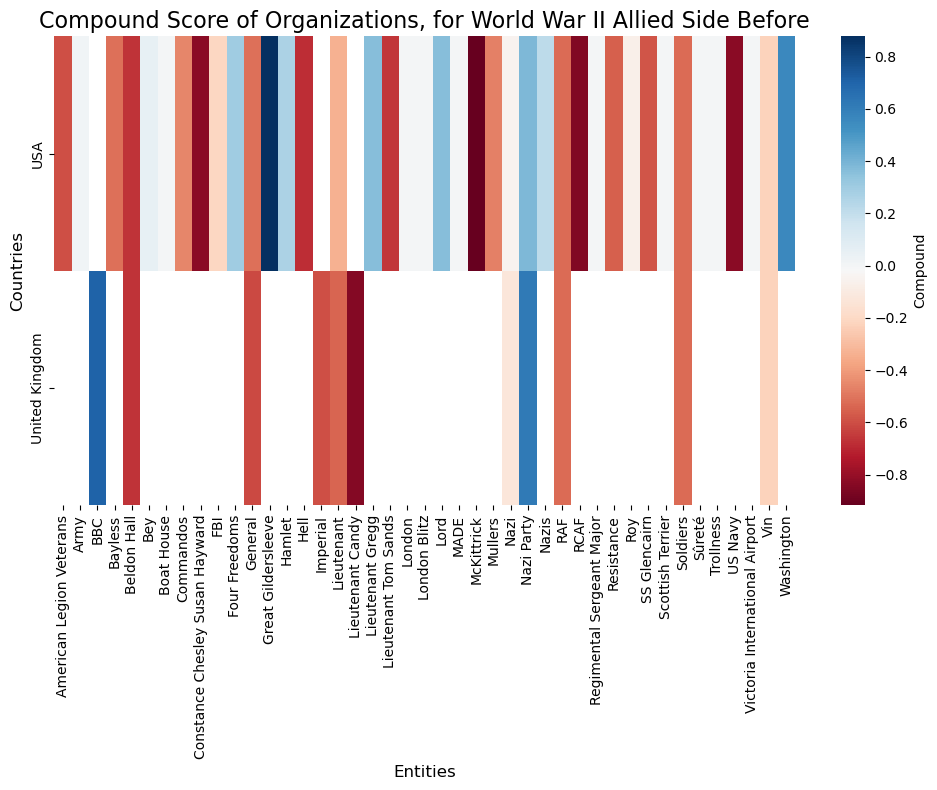

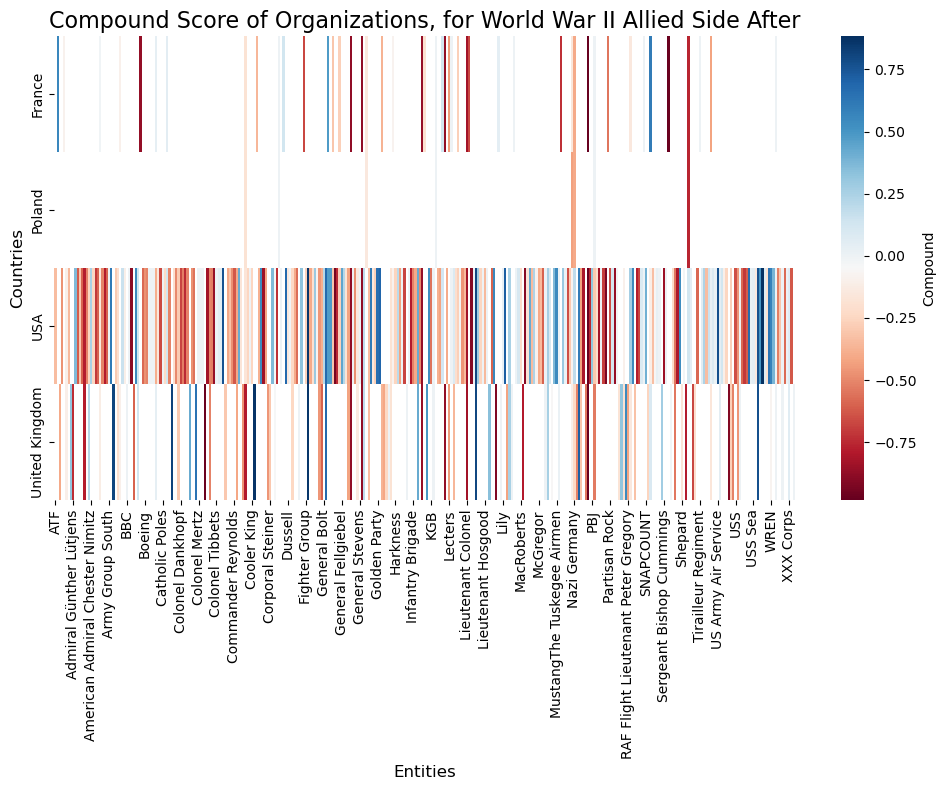

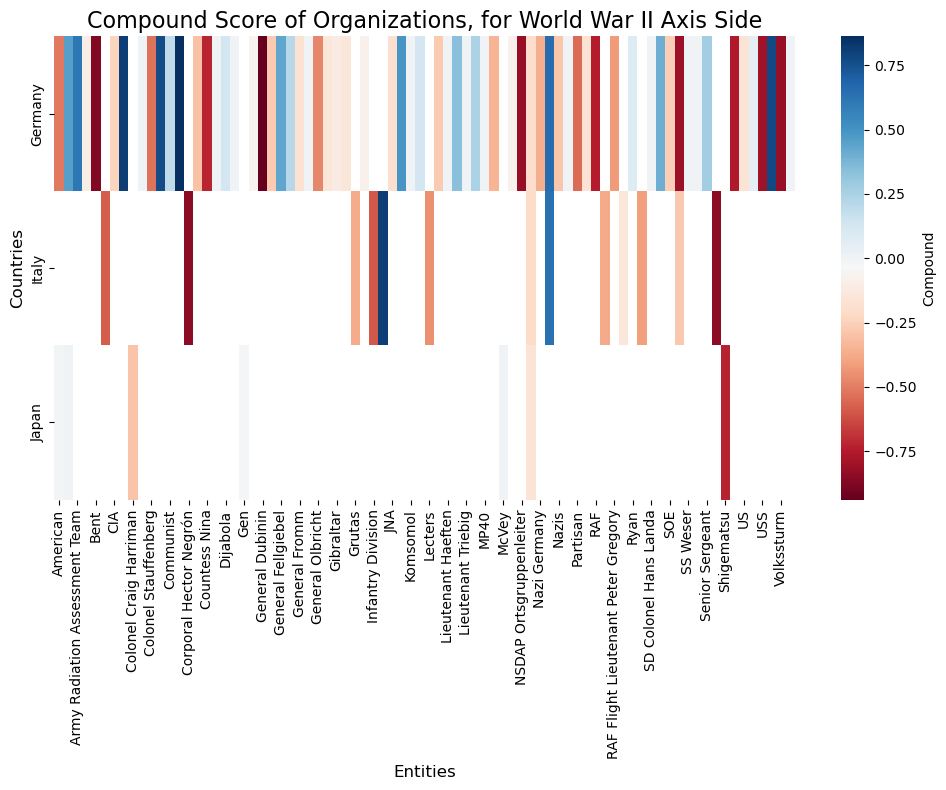

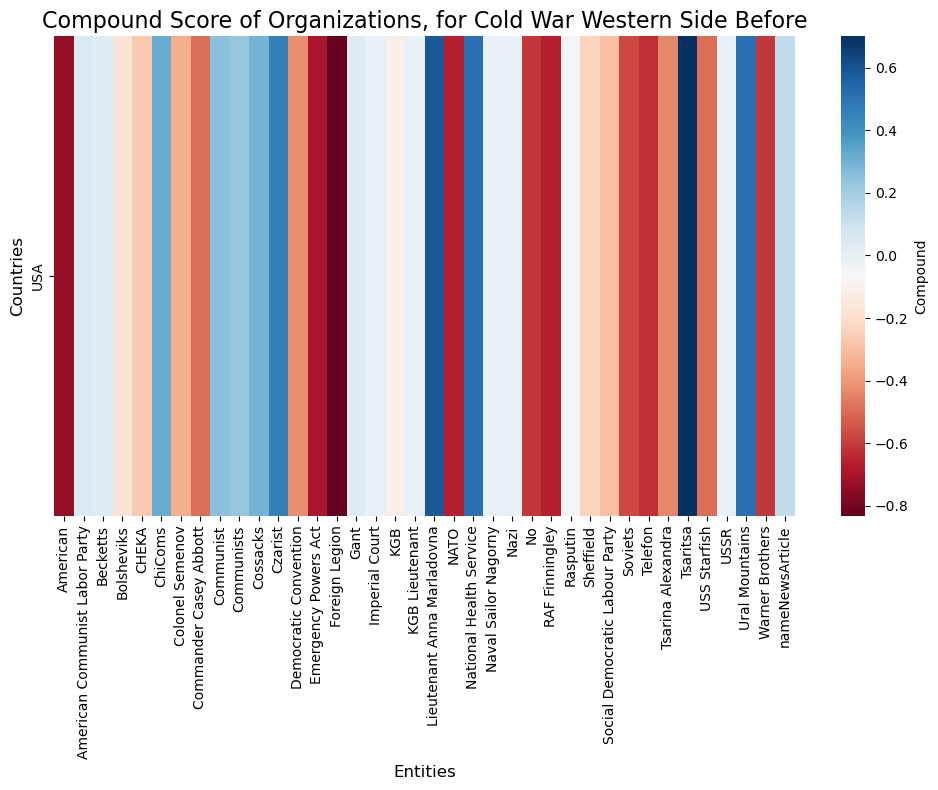

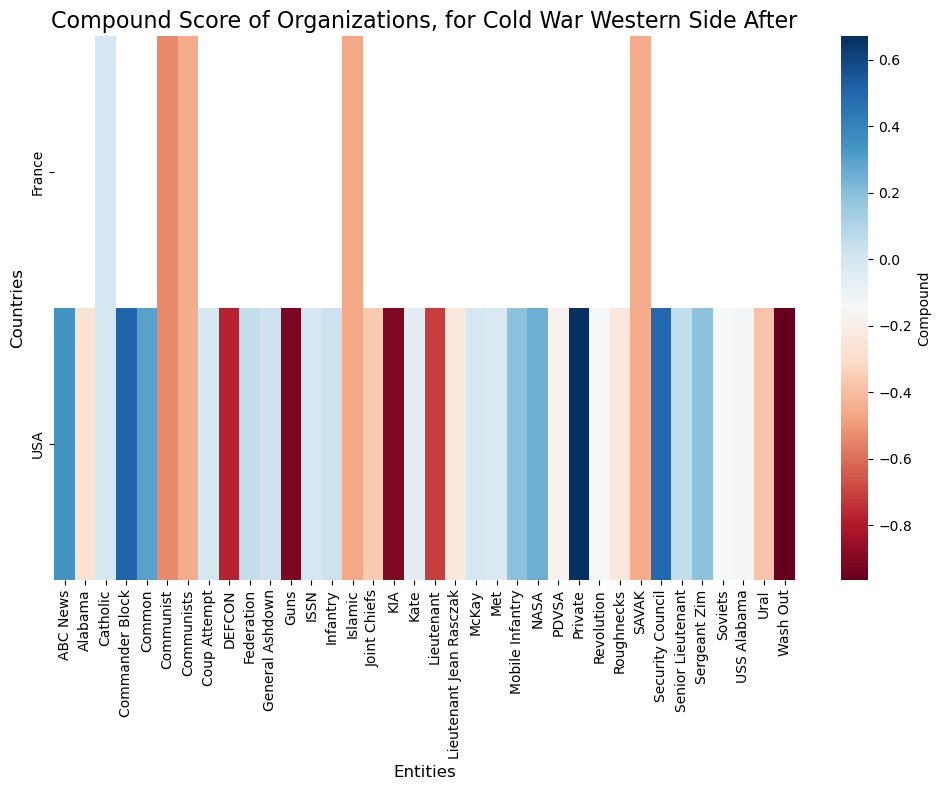

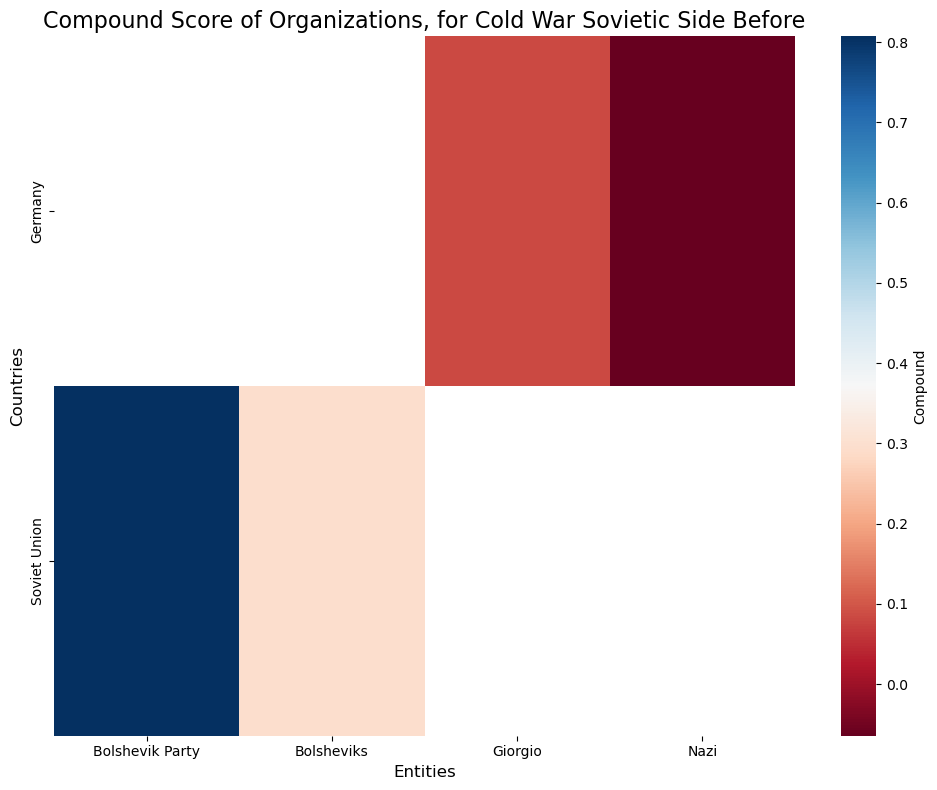

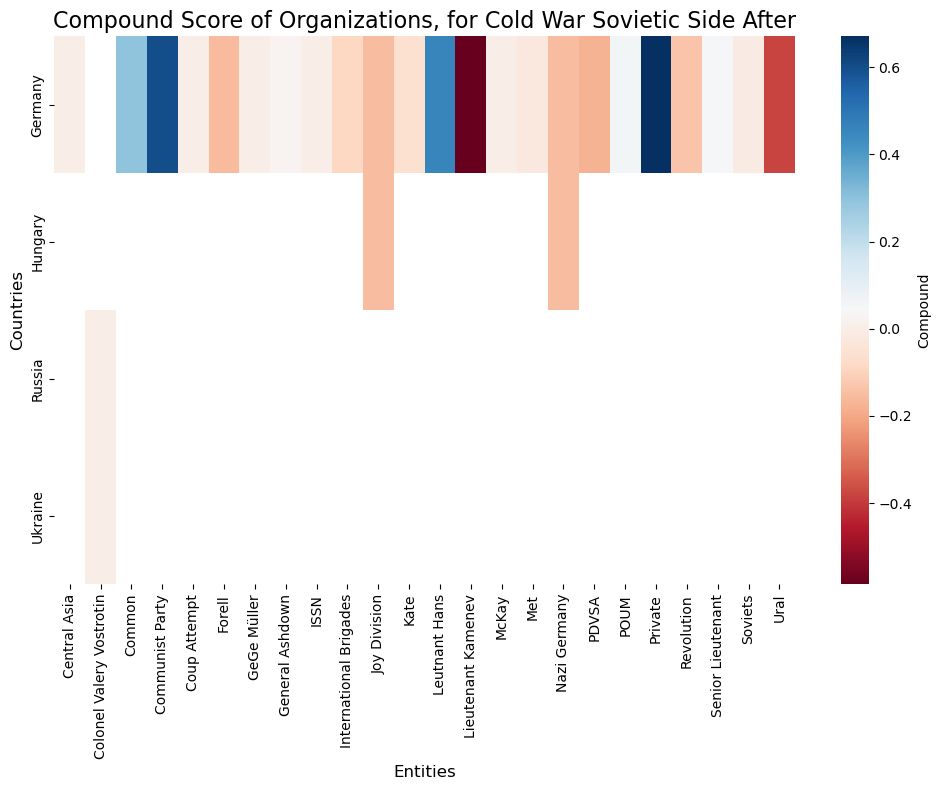

In [37]:

# Performing entity level sentiment analysis and plotting the corresponding heatmaps
entity_level_sent_analysis(wars_iterator, war_names, side_iterator)

For World War II, we were able to make three key observations:
* Military Authorities have an universally negative depiction
Regardless of the geopolitical side, military authorities are predominantly portrayed negatively before and after the conflict.
One key example of this phenomenon appears in the heatmaps of the Allied forces (before and after the conflict), where entities tagged with military ranks like “Commander” and “Infantry” consistently exhibit highly negative scores. This reflects a recurring portrayal of militarism as oppressive and destructive, particularly when analyzed over time. Even as the conflict resolves, negative sentiment toward military organizations persists.
* Political parties sentiment shift with context and time
The main example of this phenomenon is the portrayal of the Nazi Party in cultural narratives, which reveals temporal and cultural shifts.
On the first hand, in early Allied Forces representations, the Nazi Party occasionally exhibits positive sentiment scores. For example, the heatmap reveals a positive sentiment score of 0.61525 in the UK. This likely reflects pre-conflict ambivalence when the Nazi Party was not yet universally associated with its later actions. After the conflict, however, still in the western perspective, the party’s portrayal becomes uniformly negative, aligning with the global consensus on its role in the war.
On the other hand, in the Axis Forces’ heatmap, the Nazi Party is consistently portrayed with neutral to highly negative score, reflecting a post-war cultural reckoning within Germany.
* International Organizations as stabilizing roles
Entities like NATO and other international organizations show a trend of neutral sentiment, notably in Western narratives. For example, in the post-conflict Allied Forces’ heatmap, NATO maintains neutral scores, emphasizing their portrayal as stabilizing forces.



During the Cold War which was more an ideologicl conflict, Western media showed mixed sentiment toward entities, with negative views on organizations like the KGB and Communist Party, yet some US entities also faced criticism. This reflects freer speech allowing nuanced narratives despite overall hostility. Military concepts like DEFCON carried strong negative sentiments, mirroring fears of conflict.
Post-Cold War, sentiments toward Soviet bloc entities softened as tensions eased. In contrast, Soviet media consistently portrayed its allied entities, like the Bolshevik Party, positively (~0.8 sentiment), reflecting the controlled narratives of a tightly regulated media landscape.


## Question 4: Audience Preferences During Crises

In this question we will conduct the analysis by aligning global events such as wars, pandemics, and natural disasters to inspect both short-term and long-term shifts in audience preferences. To do this, we will inspect genre-specific trend analysis to identify immediate spikes in popularity as well as sustained changes over time. Later on, we will visualize the data to highlight both immediate and lasting impacts of global events on movie thematics.

In order to achieve this, we will utilize the Google Search Trends insights that will help us uncover user interest for both general movie genres and thematics and parcular movies in our aggregated movies dataset.

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from src.utils import google_trends as gt
import seaborn as sns
from src.utils.genres import get_top_genres, regression_analysis, genres_vs_interest_correlation
from datetime import datetime
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
# Import the movies data
movies = pd.read_table("data/movies_with_summaries.csv", sep=",")

#### 1. Inspecting overall audience preferences

In previous parts we have found the most prominent movies genres. We can check if the distribution of all movie genres reflects the viewer preferences of these same genres.

In [ ]:
genres = get_top_genres(movies, 20)

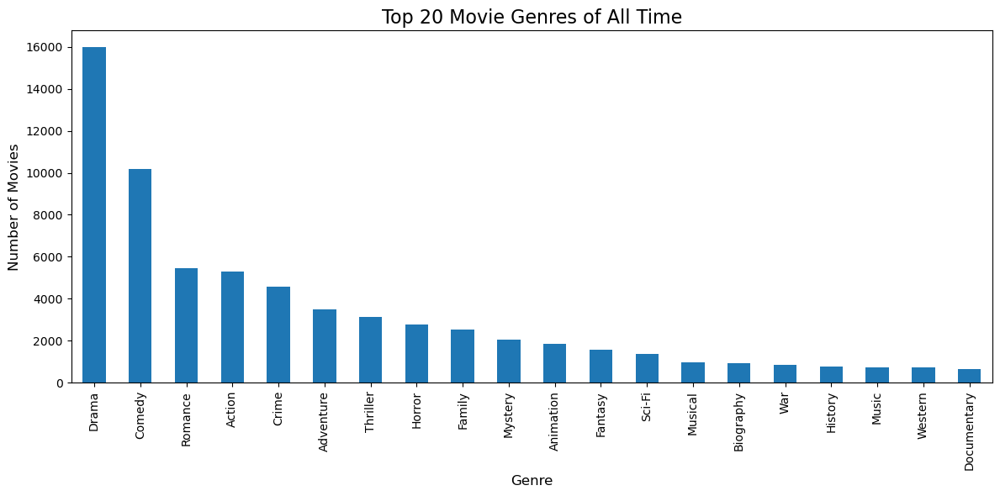

In [ ]:
# Plot the distribution of genres
genres.plot(kind='bar', x='Genre', y='Count', legend=False, figsize=(12, 6))
plt.title('Top 20 Movie Genres of All Time', fontsize=16)
plt.ylabel('Number of Movies', fontsize=12)
plt.xlabel('Genre', fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

We can now check if the popularity distribution of these genres is reflected in public preference. For this we can use the search trends that would help us understand the public preferences over a period of 2004-2012

In [ ]:
# Get the search interest for each genre
all_trends = gt.fetch_historical_interest_for_genres(genres)

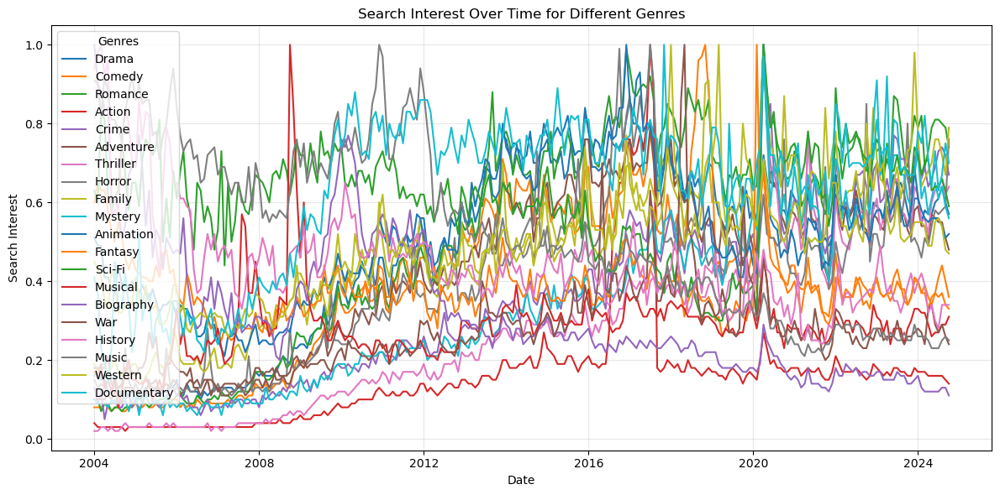

In [ ]:
# Create the plot
plt.figure(figsize=(12, 6))
for genre in all_trends['Genre'].unique():
    genre_trend = all_trends[all_trends['Genre'] == genre]
    plt.plot(genre_trend['date'], genre_trend['value'], label=genre)

# Add labels and legend
plt.title('Search Interest Over Time for Different Genres')
plt.xlabel('Date')
plt.ylabel('Search Interest')
plt.legend(title='Genres', loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The graph is unreadable! (Obviously) Let's try to untangle the trend with a more elegant visualization.

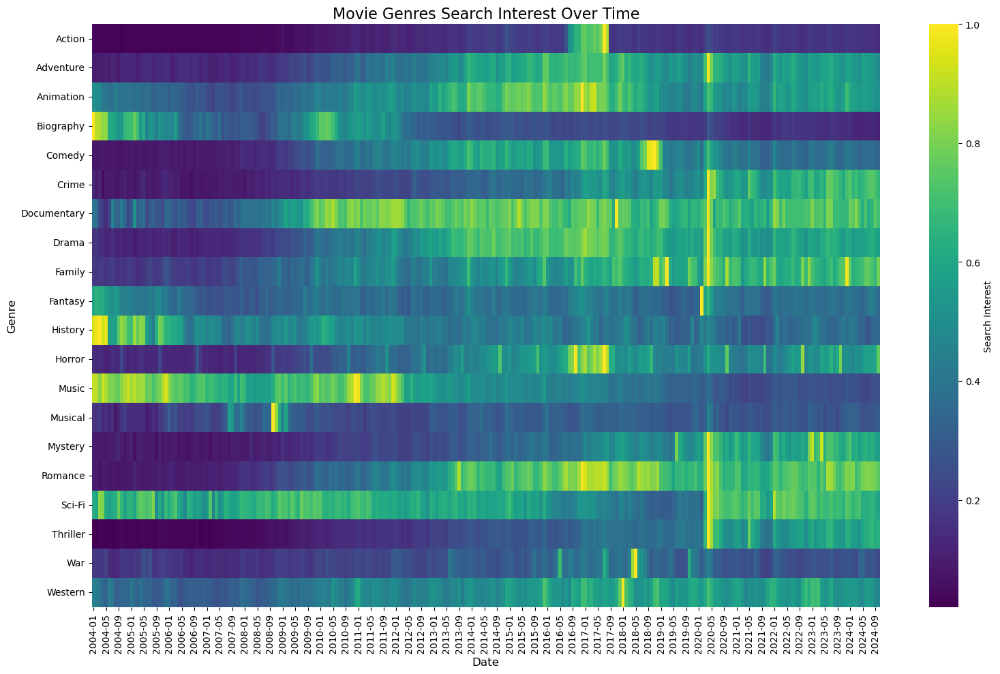

In [ ]:
# Pivot the data to create a heatmap
heatmap_data = all_trends.pivot(index='Genre', columns='date', values='value')

# Format the date to show only year and month
heatmap_data.columns = heatmap_data.columns.strftime('%Y-%m')

# Plot the heatmap
plt.figure(figsize=(16, 10))
sns.heatmap(heatmap_data, cmap='viridis', linewidths=0, cbar_kws={'label': 'Search Interest'})

# Add labels and title
plt.title('Movie Genres Search Interest Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Genre', fontsize=12)

# Rotate x-axis labels
plt.xticks(rotation=90, ha='center')

plt.tight_layout()
plt.show()

The first general observation is that the overall movies popularity peaked in 2016-2017 and then again in the beginning of COVID pandemics. The reason for the peak during the pandemics is clear - we were at stuck inside, what else could we do? However, why was there another peak in 2016-2017?

This peak could be explained by two of many other factors: 1) By 2015, streaming had firmly established itself as a dominant force in the entertainment industry. Netflix had expanded to over 190 countries, and Amazon Prime Video had also become a significant player, therefore driving interest in movies. 2) 2016-2018 were among the best years in history with the number of newly released movies as well as box office numbers peaked (Source: [BoxOfficeMojo](https://www.boxofficemojo.com/year/)). Further analysis of such factors would be a particularly interesting idea but is worth another ADA project by itself.

If we zoom out, we can also observe strong seasonality patterns in particular movie genre interest. For example, interest for horror movies generally peaks during Halloween season and Family movies peak around Christmas. 

### 2. Uncovering seasonal trends

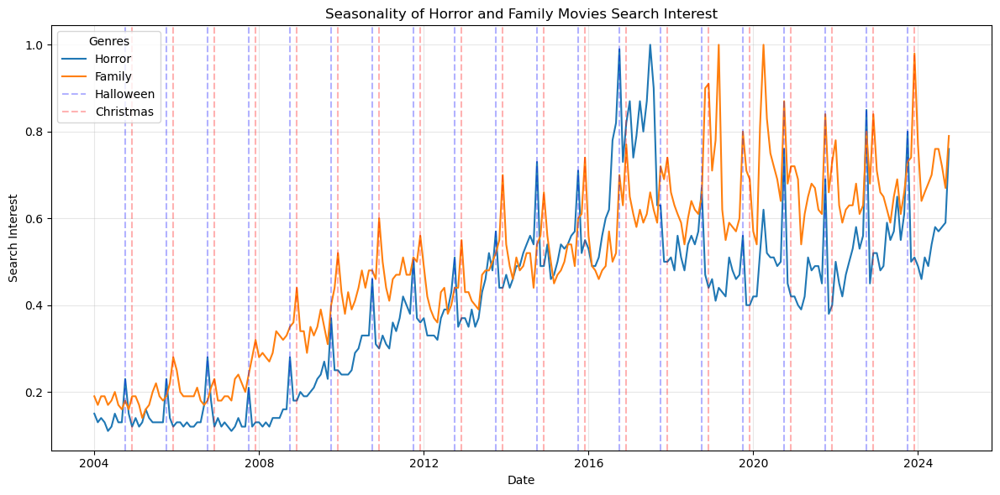

In [ ]:
# Plot monthly interest for Horror, Family movies
horror = all_trends[all_trends['Genre'] == 'Horror']
family = all_trends[all_trends['Genre'] == 'Family']

# Create the plot
plt.figure(figsize=(12, 6))
plt.plot(horror['date'], horror['value'], label='Horror')
plt.plot(family['date'], family['value'], label='Family')

# Mark Every October and December with a vertical line
for year in range(2004, 2024):
    october = datetime.strptime(f"{year}-10", "%Y-%m")
    plt.axvline(october, color='blue', alpha=0.3, linestyle='--')
    december = datetime.strptime(f"{year}-12", "%Y-%m")
    plt.axvline(december, color='red', alpha=0.3, linestyle='--')

# Add vertical lines to legend
plt.plot([], [], color='blue', alpha=0.3, linestyle='--', label='Halloween')
plt.plot([], [], color='red', alpha=0.3, linestyle='--', label='Christmas')

plt.title('Seasonality of Horror and Family Movies Search Interest')
plt.xlabel('Date')
plt.ylabel('Search Interest')
plt.legend(title='Genres')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

We can now perform a seasonal decomposition analysis to further inspect these patterns for all movie genres. This analysis is performed using an additive seasonality signal:

Y[t] = T[t] + S[t] + e[t]

- Y[t]: Popularity of a movie genre at time t
- T[t]: Trend
- S[t]: Seasonality
- e[t]: Residual (random noise)

This helps us to firstly identify if there are movie movie genres exhibiting strong seasonality patterns and secondly to identify the seasonality period for each genre. While we do not find more positive seasonality patterns as for Horror and Family movies, we can observe an more significant negative seasonality where historical movies popularity reduces during the summer months. One potential reason could be that historical movies are consumed for educational purposes, therefore during the summer months, when students are on vacation, the interest in historical movies decreases.

In [ ]:
genres = all_trends['Genre'].unique()
genre_decompositions = {}

# Perform seasonal decomposition for each genre
for genre in genres:
    genre_data = all_trends[all_trends['Genre'] == genre].set_index('date')['value']
    
    # Apply seasonal decomposition
    decomposition = seasonal_decompose(genre_data, model='additive', period=12)
    genre_decompositions[genre] = decomposition

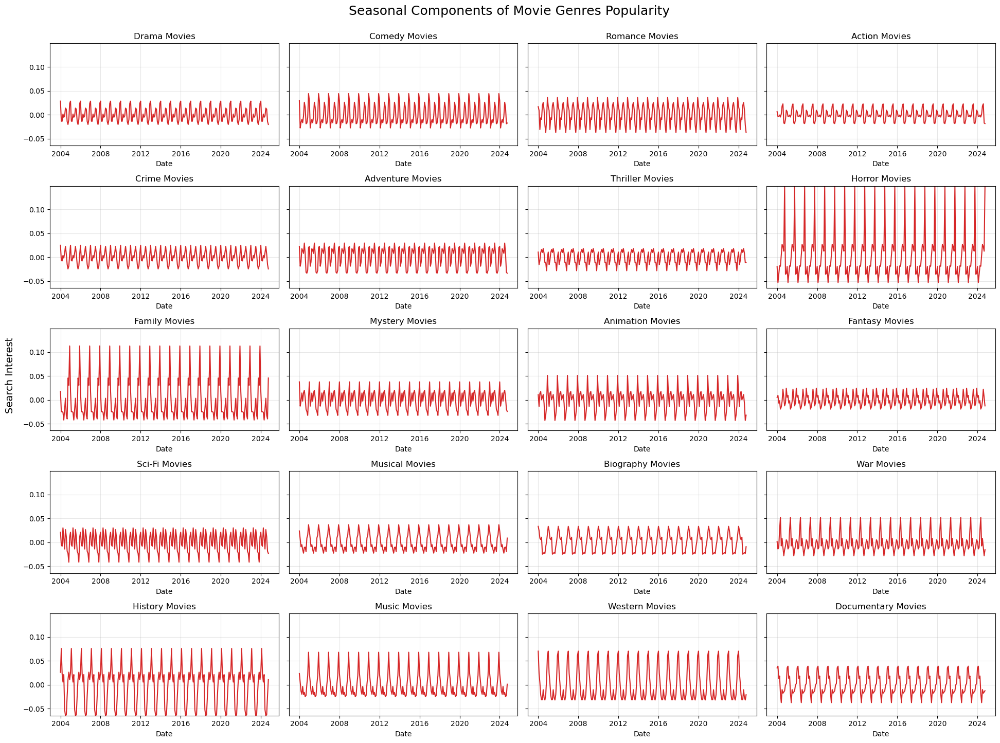

In [ ]:
# Set up the subplots
fig, axes = plt.subplots(5, 4, figsize=(20, 15), sharey=True)
axes = axes.flatten()
y_min = min([decomposition.seasonal.min() for decomposition in genre_decompositions.values()])
y_max = max([decomposition.seasonal.max() for decomposition in genre_decompositions.values()])

# Plot each genre's seasonal component
for i, genre in enumerate(genres):
    decomposition = genre_decompositions[genre]
    axes[i].plot(decomposition.seasonal, label='Seasonality', color='tab:red')
    axes[i].set_title(f'{genre} Movies')
    axes[i].set_xlabel('Date')
    axes[i].grid(alpha=0.3)
    axes[i].set_ylim(y_min, y_max)

# Set a common y axis label
fig.text(0.01, 0.5, 'Search Interest', va='center', rotation='vertical', fontsize=14)

# Adjust layout
fig.suptitle('Seasonal Components of Movie Genres Popularity', fontsize=18)
plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])
plt.show()

This analysis also uncovers the trend for each genre. 

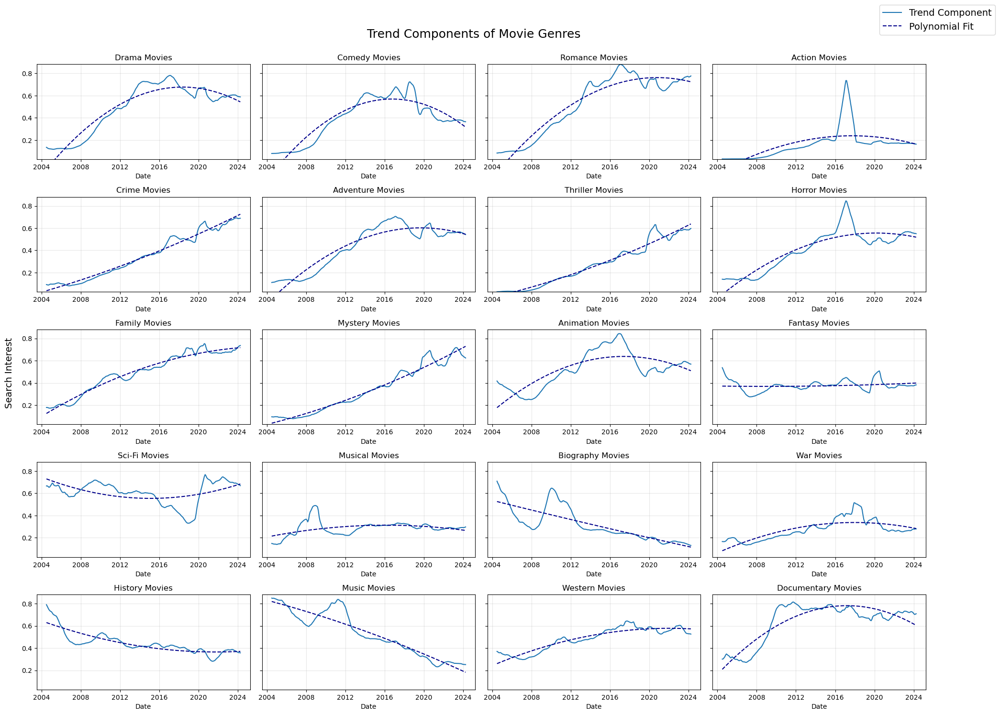

In [ ]:
fig, axes = plt.subplots(5, 4, figsize=(20, 15), sharey=True)
axes = axes.flatten()

# Get a unified y-axis range for the trend component
y_min = min([decomposition.trend.min() for decomposition in genre_decompositions.values()])
y_max = max([decomposition.trend.max() for decomposition in genre_decompositions.values()])

# Plot each genre's trend component
for i, genre in enumerate(genres):
    decomposition = genre_decompositions[genre]
    trend = decomposition.trend.dropna()

    axes[i].set_title(f'{genre} Movies')
    axes[i].set_xlabel('Date')
    axes[i].grid(alpha=0.3)
    axes[i].set_ylim(y_min, y_max)

    x = trend.index.map(lambda date: date.toordinal())
    y = trend.values

    # Fit a polynomial regression of degree 2
    coefficients = np.polyfit(x, y, deg=2)
    polynomial = np.poly1d(coefficients)

    # Generate fitted values for the polynomial line
    x_fit = np.linspace(x.min(), x.max(), 200)
    y_fit = polynomial(x_fit)

    # Plot the trend component
    axes[i].plot(trend.index, y, label='Trend', color='tab:blue')

    # Plot the polynomial regression line
    axes[i].plot([pd.Timestamp.fromordinal(int(val)) for val in x_fit], y_fit, color='darkblue', linestyle='--')
    
# Set a common y axis label
fig.text(0.01, 0.5, 'Search Interest', va='center', rotation='vertical', fontsize=14)

# Adjust layout
fig.suptitle('Trend Components of Movie Genres', fontsize=18)
plt.tight_layout(rect=[0.02, 0.02, 0.98, 0.98])

# Plot a large legend outside of the subplots
handles = [plt.Line2D([0], [0], color='tab:blue', label='Trend Component'),
           plt.Line2D([0], [0], color='darkblue', linestyle='--', label='Polynomial Fit',)]
fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.05, 1.02), fontsize=14, frameon=True)
plt.show()

Taking all these considerations into account, we can nonetheless observe clear shifts in popularity of certain genres. Are these fluctuations related to the number of movies released during the years? To answer this, we will have to restrict ourselves in movies data availability period which overlaps with available Google Search Trends Data for years 2004-2012.

### 3. Comparing movie releases and genre popularity

In [ ]:
results_df = genres_vs_interest_correlation(movies, all_trends, genres)

c:\Users\aidas\ada-2024-project-americandentalassociation\src\utils\genres.py:185: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trends_filtered['Year'] = trends_filtered['date'].dt.year


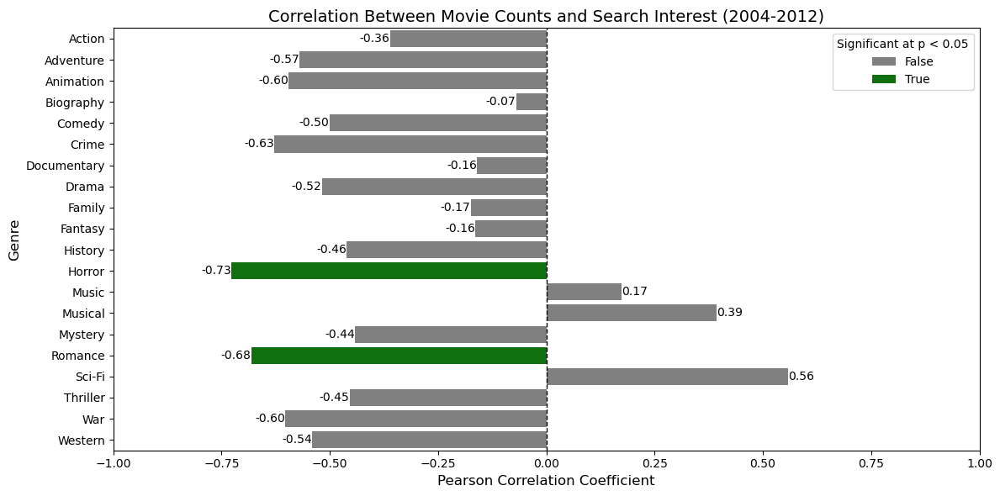

In [ ]:
# Visualize the correlations
plt.figure(figsize=(12, 6))
sns.barplot(
    data=results_df.sort_values('Correlation', ascending=False),
    x='Correlation',
    y='Genre',
    hue=(results_df['P-Value'] < 0.05),
    dodge=False,
    palette={True: 'green', False: 'gray'}
)

# Show the correlation values
for i, row in results_df.iterrows():
    plt.text(row['Correlation'], i, f"{row['Correlation']:.2f}", va='center', ha= 'right' if row['Correlation'] < 0 else 'left')

# Set the x-axis limits
plt.xlim(-1, 1)

# Add labels and title
plt.title('Correlation Between Movie Counts and Search Interest (2004-2012)', fontsize=14)
plt.xlabel('Pearson Correlation Coefficient', fontsize=12)
plt.ylabel('Genre', fontsize=12)
plt.axvline(0, color='black', linestyle='--', linewidth=1)
plt.legend(title='Significant at p < 0.05')
plt.tight_layout()
plt.show()

### 4. Estimating the impact of global events on movie genre popularity

In [ ]:
# Fetch relevant data
events = pd.read_csv("data/events.csv")
all_trends = pd.read_csv('data/genre_trends.csv')

In [ ]:
events_monthly, trends_monthly = gt.get_events_trends_monthly(events, all_trends)

c:\Users\aidas\ada-2024-project-americandentalassociation\src\utils\google_trends.py:149: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  events_filtered['Month'] = events_filtered['date'].dt.to_period('M').astype(str)
c:\Users\aidas\ada-2024-project-americandentalassociation\src\utils\google_trends.py:154: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trends_filtered['Month'] = trends_filtered['date'].dt.to_period('M').astype(str)


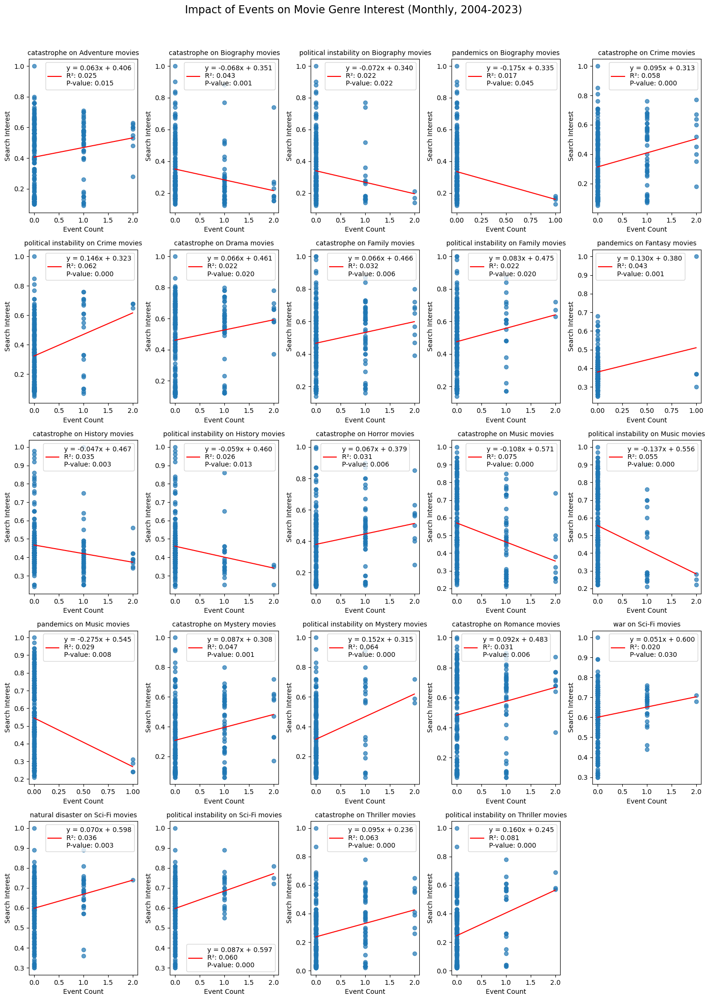

In [ ]:
regression_df = regression_analysis(events_monthly, trends_monthly)

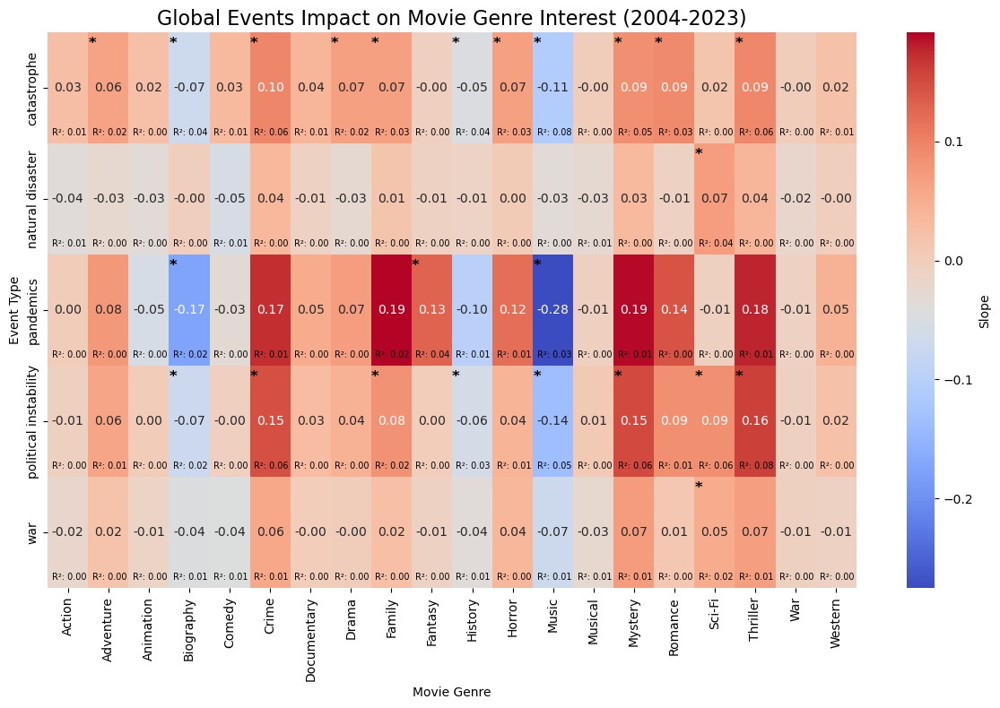

In [ ]:
# Pivot the data to create a matrix of slopes for heatmap
heatmap_data = regression_df.pivot_table(index='event_type', columns='genre', values='slope')

# Create a heatmap
plt.figure(figsize=(12, 8))
ax = sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", cbar_kws={'label': 'Slope'})

# Add R-squared values to the heatmap
for i in range(len(regression_df)):
    event_type = regression_df.iloc[i]['event_type']
    genre = regression_df.iloc[i]['genre']
    r_squared = regression_df.iloc[i]['r_squared']
    
    # Get the numeric indices for event_type and genre
    event_type_idx = heatmap_data.index.get_loc(event_type)
    genre_idx = heatmap_data.columns.get_loc(genre)
    
    ax.text(genre_idx + 0.1, event_type_idx + 0.9, f'R²: {r_squared:.2f}', ha='left', va='center', fontsize=7)

# Mark statistical significance
for i in range(len(regression_df)):
    if regression_df.iloc[i]['p_value'] < 0.05:
        event_type = regression_df.iloc[i]['event_type']
        genre = regression_df.iloc[i]['genre']
        
        # Get the numeric indices for event_type and genre
        event_type_idx = heatmap_data.index.get_loc(event_type)
        genre_idx = heatmap_data.columns.get_loc(genre)
        
        # Add significance marker
        ax.text(genre_idx + 0.1, event_type_idx + 0.1, '*', color='black', ha='center', va='center', fontweight='bold', fontsize=12)

plt.title("Global Events Impact on Movie Genre Interest (2004-2023)", fontsize=16)
plt.xlabel("Movie Genre")
plt.ylabel("Event Type")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### 5. Analyzing short term impact of war events

Moving to the short term trends, in face of starting wars, can we observe a short term impact on audience preferences? To answer this question, we will inspect the popularity of war and historical movies around the period when wars started.

In [ ]:
events = pd.read_csv("data/events.csv")

In [ ]:
# Filter all wars for the period 2004-2012
wars = events[events['event_type'] == 'war']
wars_filtered = wars[(wars['date'] >= '2004-01-01') & (wars['date'] <= '2023-12-31')]

# Filter out the events which indicate an end of a war
wars_filtered = wars_filtered[(~wars_filtered['description'].str.contains('ends', case=False)) & ~(wars_filtered['description'].str.contains('end', case=False))]

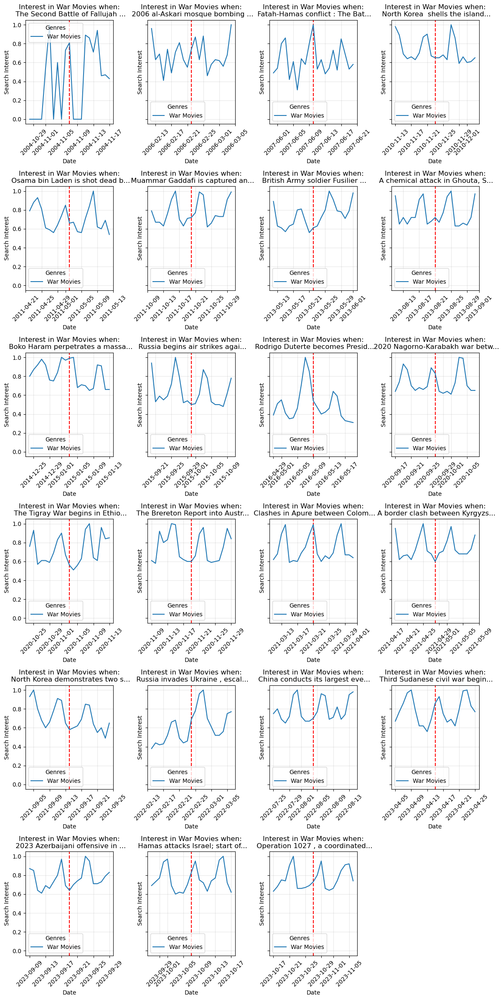

In [ ]:
cols = 4
rows = (len(wars_filtered) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows), sharey=True)
axes = axes.flatten()

# Loop through each war event
for i, (index, war) in enumerate(wars_filtered.iterrows()):
    date = war['date']
    description = war['description']

    # Select the appropriate subplot
    ax = axes[i]

    ax.axvline(pd.to_datetime(date), color='red', linestyle='--', linewidth=1.5)

    # Fetch the search interest around the date
    trend = gt.query_interest_around_date("war movies", date)

    # Plot the trend value over time
    ax.plot(trend['date'], trend['value'], label="War Movies")

    # Set titles and labels for each subplot
    ax.set_title(f'Interest in War Movies when:\n {description.split(".")[0][:30]}{"..." if len(description) > 25 else ""}')
    ax.set_xlabel('Date')
    ax.set_ylabel('Search Interest')

    # Add labels and legend
    ax.legend(title='Genres')
    ax.grid(alpha=0.3)

    # Rotate x-axis labels
    ax.tick_params(axis='x', rotation=45)

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()